In [27]:
!date

Fri Apr 12 07:13:39 PDT 2019


# Imports

In [28]:
import os
from pathlib import Path
import numpy as np
from IPython.display import display, HTML, Math
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import pybroom as br
from multispot_utils import heatmap48, spotsh, spotsv, info_html

In [29]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

plt.rcParams['font.sans-serif'].insert(0, 'Arial')
plt.rcParams['path.simplify_threshold'] = 1.0
plt.rcParams['font.size'] = 14

In [30]:
from fretbursts import *

In [31]:
sns = init_notebook(apionly=True)

In [32]:
plot_timetraces = True
skip_ch = (12, 13)

In [33]:
_plot_status = {}

# Load HDF5 files

In [34]:
mlabels = ['-8TA_-3NTD_500pM_no-flow_0-200s', '-8TA_-3NTD_500pM_Streets_chip_with_flow_0-200s']
mlabels

['-8TA_-3NTD_500pM_no-flow_0-200s',
 '-8TA_-3NTD_500pM_Streets_chip_with_flow_0-200s']

In [35]:
dir_ = '.'
dir_ = Path(dir_).absolute()
dir_

PosixPath('/Users/maya/Documents/weiss_lab/48-spot/multispot_review_results')

In [36]:
ls $dir_

05_-8TA_-3NTD_500pM.hdf5*
05_-8TA_-3NTD_500pM_cache.hdf5
06_-8TA_-3NTD_500pM_ASchip.hdf5*
06_-8TA_-3NTD_500pM_ASchip_cache.hdf5
README.md
__pycache__/
_config.yml
burst_analysis_for_flow_vs_no-flow_0-200s.ipynb
burst_analysis_no_flow_50kcps_vs_with_flow_75kcps.ipynb
cal_phrates.py
figures/
metadata/
results/
save_results_for_flow_vs_no-flow_0-200s-50kcps_75kcps_size_sel_40-64.ipynb
save_results_for_flow_vs_no-flow_0-200s-50kcps_75kcps_size_sel_40.ipynb
save_results_for_flow_vs_no-flow_0-200s.ipynb
save_results_for_flow_vs_no-flow_0-200s_v2.ipynb


In [37]:
# sort to have chronological order for repeats
filepaths = sorted([f for f in Path(dir_).glob('*.hdf5') 
                   if 'cache' not in f.stem]) 
fnames = [f.name for f in filepaths]
fnames

['05_-8TA_-3NTD_500pM.hdf5', '06_-8TA_-3NTD_500pM_ASchip.hdf5']

In [38]:
f0 = fnames[0][:19]
f1 = fnames[1][:26]
f0, f1

('05_-8TA_-3NTD_500pM', '06_-8TA_-3NTD_500pM_ASchip')

In [39]:
save_dir = './figures'
Path(save_dir).absolute()

PosixPath('/Users/maya/Documents/weiss_lab/48-spot/multispot_review_results/figures')

# Load data

In [40]:
d0 = loader.photon_hdf5(fnames[0]) # no flow
d1 = loader.photon_hdf5(fnames[1]) # with flow

In [41]:
info_html(d0)

In [42]:
info_html(d1)

In [43]:
blue = '#0055d4'
green = '#2ca02c'
red = '#e74c3c'  # '#E41A1C'
purple = '#9b59b6'
cyan = '#00FFFF'

In [44]:
def plot_alternation_hist_usalex(d0, d1, bins=None, ax=None, ich0=0, ich1=0, #adding a data object to function
                                 hist_style={}, span_style={}):
    """Plot the us-ALEX alternation histogram for the variable `d`.

    This function must be called on us-ALEX data **before** calling
    :func:`fretbursts.loader.alex_apply_period`.
    """
    if ax is None:
        _, ax = plt.subplots()

    if bins is None:
        bins = 100

    D0_ON, A0_ON = d0._D_ON_multich[ich0], d0._A_ON_multich[ich0]
    D1_ON, A1_ON = d1._D_ON_multich[ich1], d1._A_ON_multich[ich1]
    d0_ch, a0_ch = d0._det_donor_accept_multich[ich0]
    d1_ch, a1_ch = d1._det_donor_accept_multich[ich1]
    offset0 = d0.get('offset', 0)
    offset1 = d1.get('offset', 0)
    
    ph0_times_t, det0_t = d0.ph_times_t[ich0][:], d0.det_t[ich0][:]
    ph1_times_t, det1_t = d1.ph_times_t[ich1][:], d1.det_t[ich1][:]
    period0 = d0.alex_period
    period1 = d1.alex_period
    d0_em_t = (det0_t == d0_ch)
    d1_em_t = (det1_t == d1_ch)
    
    hist_style_ = dict(bins=bins, histtype='step', lw=2, alpha=0.9, zorder=4) #zorder=2
    hist_style_.update(hist_style)
    span_style_ = dict(alpha=0.2, zorder=2) #zorder=1 
    span_style_.update(span_style)

    D0_label = 'Donor: %d-%d, no flow' % (D0_ON[0], D0_ON[1])
    D1_label = 'Donor: %d-%d, Streets chip with 10μL flow rate' % (D1_ON[0], D1_ON[1])
    A0_label = 'Accept: %d-%d, no flow' % (A0_ON[0], A0_ON[1])
    A1_label = 'Accept: %d-%d, Streets chip with 10μL flow rate' % (A1_ON[0], A1_ON[1])

    ax.hist((ph0_times_t[d0_em_t] - offset0) % period0, color=green, label=D0_label,
            **hist_style_)
    ax.hist((ph1_times_t[d1_em_t] - offset1) % period1, color=blue, label=D1_label,
            **hist_style_)
    ax.hist((ph0_times_t[~d0_em_t] - offset0) % period0, color=red, label=A0_label,
            **hist_style_)
    ax.hist((ph1_times_t[~d1_em_t] - offset1) % period1, color=purple, label=A1_label,
            **hist_style_)
    
    ax.set_xlabel('Timestamp MODULO Alternation period')

    if D0_ON[0] < D0_ON[1]:
        ax.axvspan(D0_ON[0], D0_ON[1], color=green, **span_style_)
    else:
        ax.axvspan(0, D0_ON[1], color=green, **span_style_)
        ax.axvspan(D0_ON[0], period0, color=green, **span_style_)
        
    if D1_ON[0] < D1_ON[1]:
        ax.axvspan(D1_ON[0], D1_ON[1], color=green, **span_style_)
    else:
        ax.axvspan(0, D1_ON[1], color=green, **span_style_)
        ax.axvspan(D1_ON[0], period1, color=green, **span_style_)

    if A0_ON[0] < A0_ON[1]:
        ax.axvspan(A0_ON[0], A0_ON[1], color=red, **span_style_)
    else:
        ax.axvspan(0, A0_ON[1], color=red, **span_style_)
        ax.axvspan(A0_ON[0], period0, color=red, **span_style_)
    if A1_ON[0] < A1_ON[1]:
        ax.axvspan(A1_ON[0], A1_ON[1], color=red, **span_style_)
    else:
        ax.axvspan(0, A1_ON[1], color=red, **span_style_)
        ax.axvspan(A1_ON[0], period1, color=red, **span_style_)
    ax.legend(loc='center left', bbox_to_anchor=(1, 0.5), frameon=False)

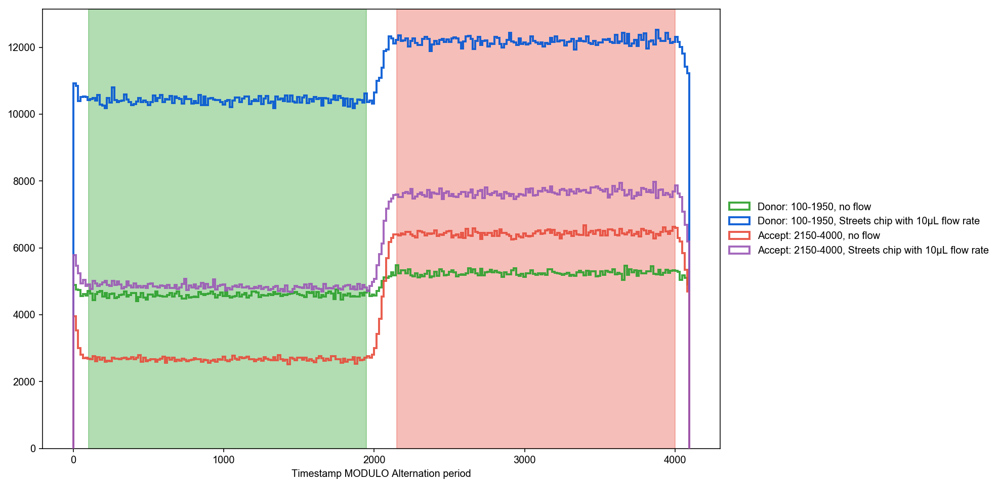

In [45]:
fig, ax = plt.subplots(figsize=(12, 8))
plot_alternation_hist_usalex(d0, d1, ax=ax, bins=np.arange(0, 4097, 16))
plt.savefig(f'{save_dir}/{mlabels[0]}_{mlabels[1]}_alternation_hist.png', bbox_inches='tight', dpi=1200);

In [46]:
%%timeit -n1 -r1 
loader.alex_apply_period(d0) 
loader.alex_apply_period(d1)

# Total photons (after ALEX selection):   121,766,143
#  D  photons in D+A excitation periods:   61,895,751
#  A  photons in D+A excitation periods:   59,870,392
# D+A photons in  D  excitation period:    48,825,342
# D+A photons in  A  excitation period:    72,940,801

# Total photons (after ALEX selection):   314,610,922
#  D  photons in D+A excitation periods:  162,968,031
#  A  photons in D+A excitation periods:  151,642,891
# D+A photons in  D  excitation period:    91,730,911
# D+A photons in  A  excitation period:   222,880,011

31.6 s ± 0 ns per loop (mean ± std. dev. of 1 run, 1 loop each)


# Select first 0 - 200 s

In [47]:
d0.time_max, d1.time_max

(300.05318665, 300.08232792499996)

In [48]:
d0 = d0.slice_ph(time_s1=0, time_s2=200)
d1 = d1.slice_ph(time_s1=0, time_s2=200)

In [49]:
d0.time_max, d1.time_max

(199.99998507499998, 199.99999778749998)

# Timetraces

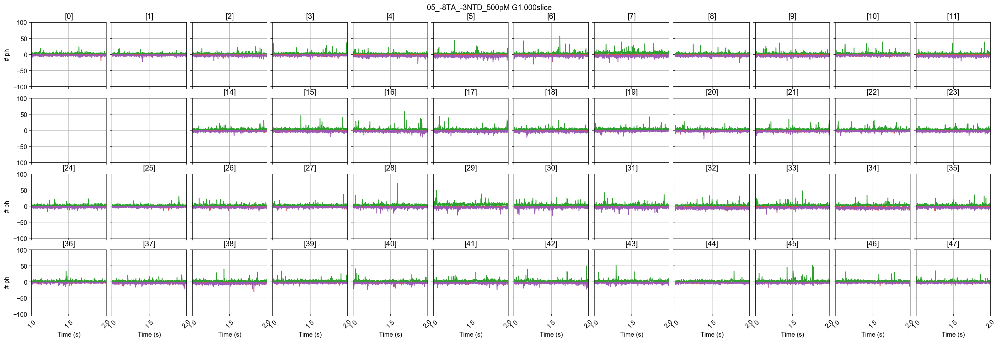

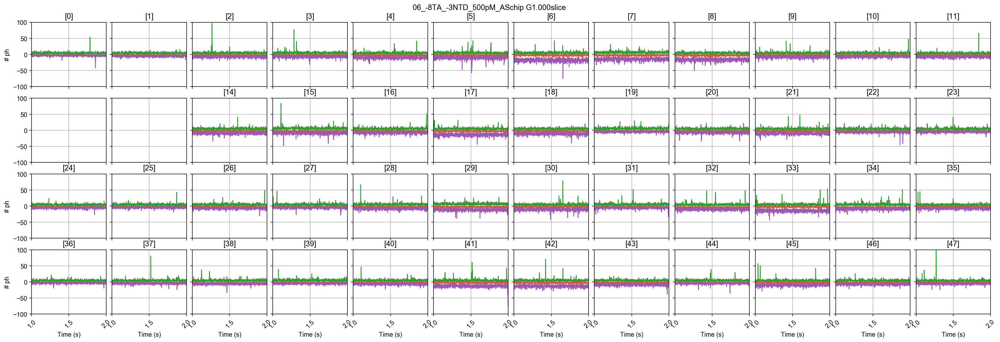

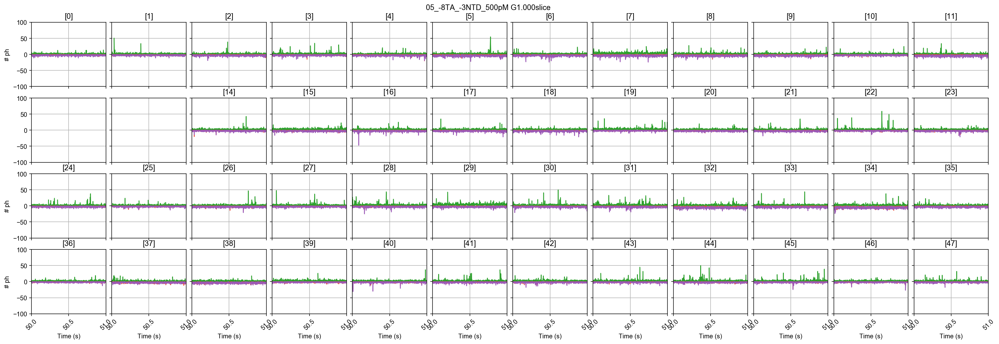

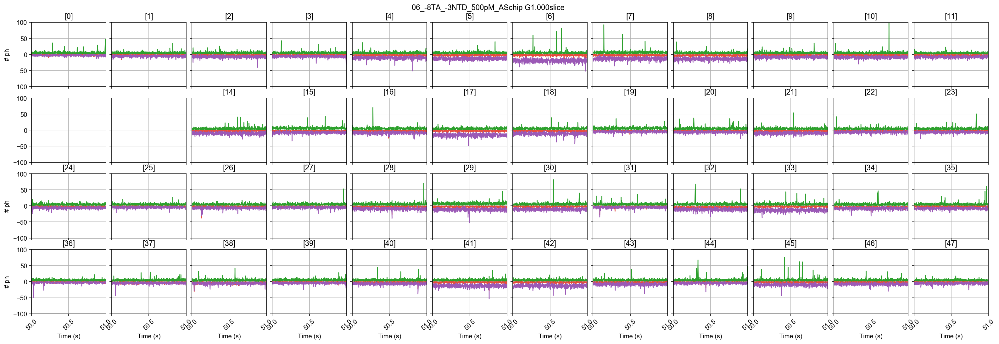

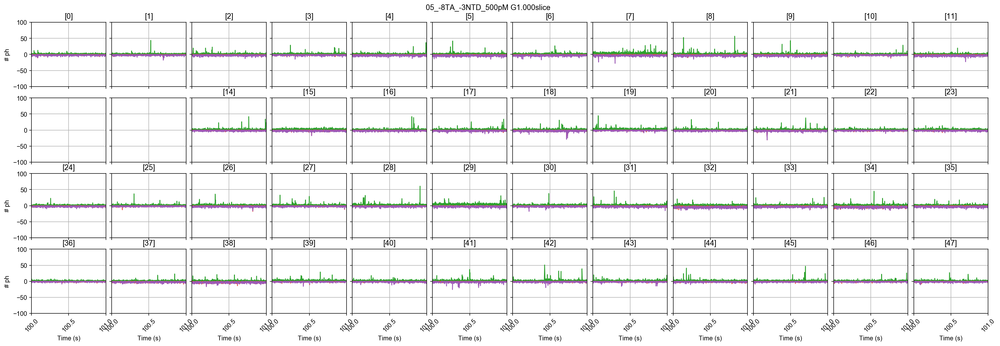

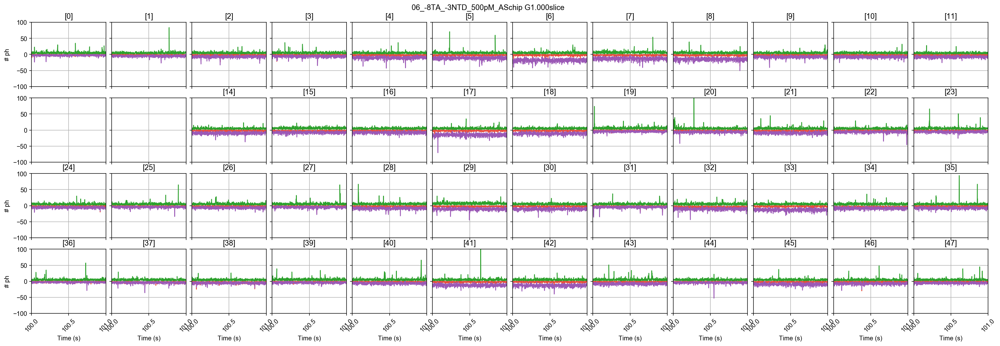

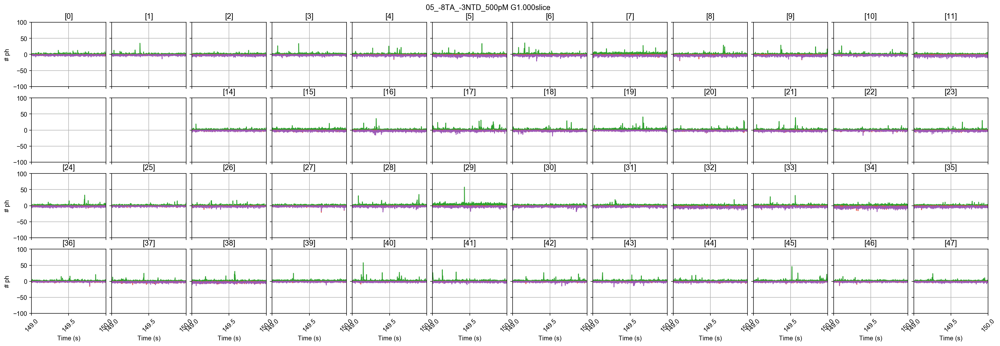

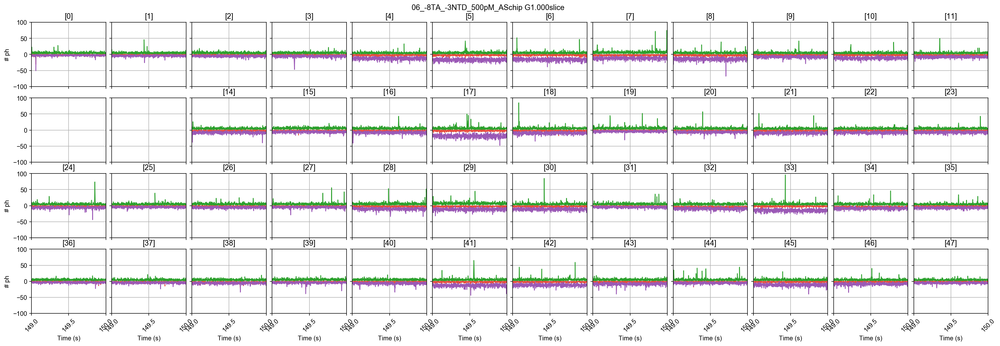

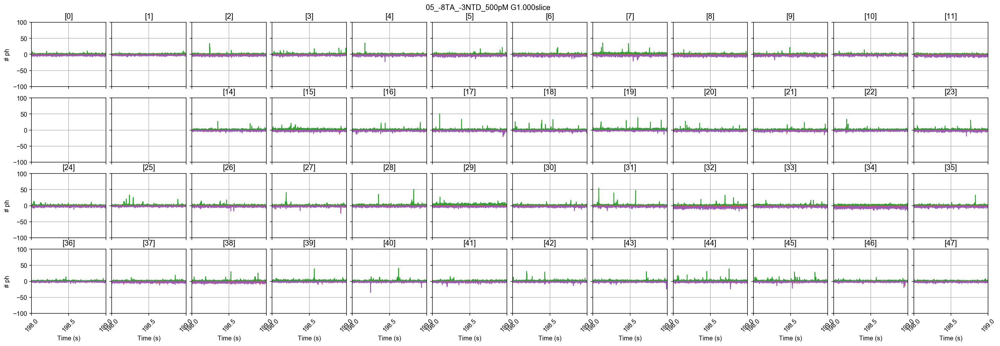

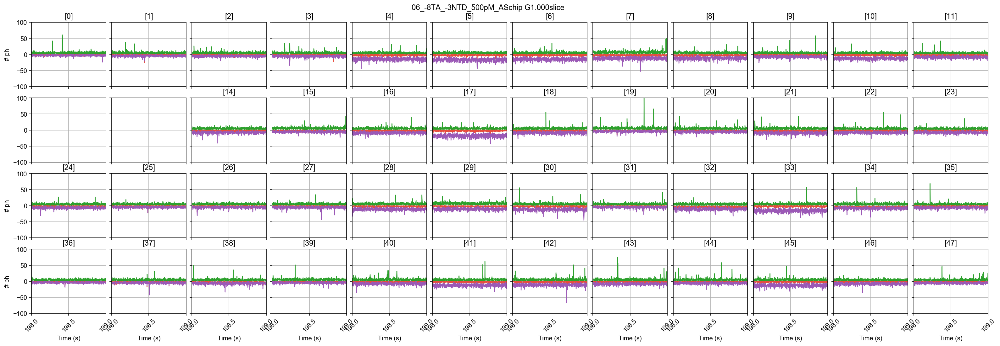

In [50]:
if plot_timetraces:
    num_time_points = 5
    kws = dict(figsize=(24, 8), skip_ch=skip_ch, xrotation=45)
    
    # Timepoints equally distributed along the measurement
    time_points = np.round(np.linspace(d0.time_min+1, d0.time_max-2, num=num_time_points))

    for i in time_points:
        dplot(d0, timetrace, tmin=i, tmax=i+1, **kws)
        plt.ylim(-100, 100)
        plt.savefig(f'{save_dir}/no_flow_timetrace={i}-{i+1}.png', dpi=1200)
        
        dplot(d1, timetrace, tmin=i, tmax=i+1, **kws)
        plt.ylim(-100, 100)
        plt.savefig(f'{save_dir}/Streets_chip_with_flow_timetrace={i}-{i+1}.png', dpi=1200);

# Background

In [51]:
d0.calc_bg(bg.exp_fit, time_s=10, tail_min_us='auto', F_bg=1)
d1.calc_bg(bg.exp_fit, time_s=10, tail_min_us='auto', F_bg=1)

 - Calculating BG rates ... [DONE]
 - Calculating BG rates ... [DONE]


## Plot background rates

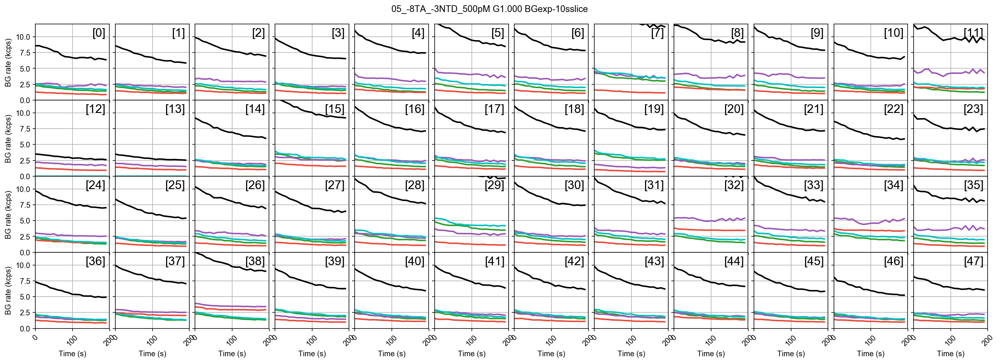

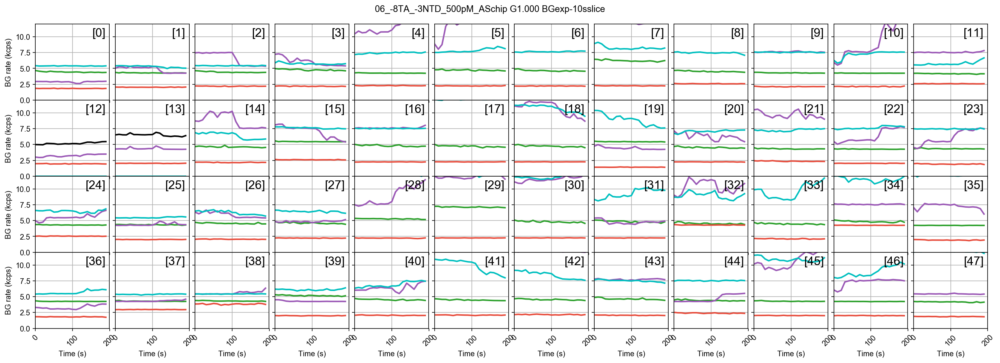

In [52]:
ax = dplot(d0, timetrace_bg, show_da=True, hspace=0, wspace=0.08,
           plot_style=dict(marker=None), title='right top', 
           title_kws=dict(fontsize=16), xrotation=45)
plt.xlim(0)
plt.ylim(0, 12)
plt.savefig(f'{save_dir}/{mlabels[0]}_background_48-spots_all_streams.png', bbox_to_anchor='tight', dpi = 1200)

ax = dplot(d1, timetrace_bg, show_da=True, hspace=0, wspace=0.08,
           plot_style=dict(marker=None), title='right top', 
           title_kws=dict(fontsize=16), xrotation=45)
plt.xlim(0)
plt.ylim(0, 12)
plt.savefig(f'{save_dir}/{mlabels[1]}_background_48-spots_all_streams.png', bbox_to_anchor='tight', dpi = 1200);

In [53]:
bg_AexDem_0 = d0.bg_from(Ph_sel(Aex='Dem'))
bg_AexAem_0 = d0.bg_from(Ph_sel(Aex='Aem'))
bg_DexDem_0 = d0.bg_from(Ph_sel(Dex='Dem'))
bg_DexAem_0 = d0.bg_from(Ph_sel(Dex='Aem'))

bg_AexDem_1 = d1.bg_from(Ph_sel(Aex='Dem'))
bg_AexAem_1 = d1.bg_from(Ph_sel(Aex='Aem'))
bg_DexDem_1 = d1.bg_from(Ph_sel(Dex='Dem'))
bg_DexAem_1 = d1.bg_from(Ph_sel(Dex='Aem'))

In [54]:
import matplotlib.patches as mpatches

In [55]:
green_patch = mpatches.Patch(color=green, label='no flow')
red_patch = mpatches.Patch(color=red, label='no flow')
blue_patch = mpatches.Patch(color=blue, label='flow rate = 10μL/hr')
purple_patch = mpatches.Patch(color=purple, label='flow rate = 10μL/hr')

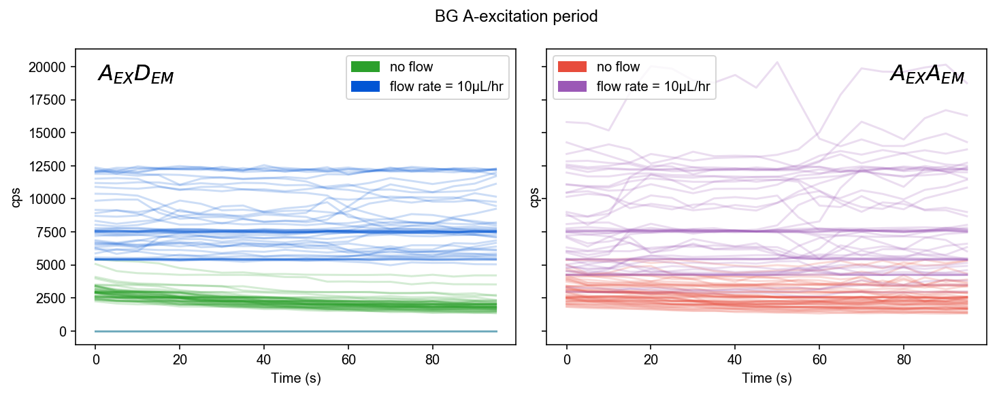

In [56]:
fig, ax = plt.subplots(1, 2, figsize=(12, 4), sharex=True, sharey=True)
fig.suptitle("BG A-excitation period")
t0 = np.arange(len(bg_AexDem_0[0])) * 5
t1 = np.arange(len(bg_AexDem_1[0])) * 5
ax[0].plot(t0, np.array(bg_AexDem_0).T, color=green, alpha=0.2)
ax[1].plot(t0, np.array(bg_AexAem_0).T, color=red, alpha=0.2)
ax[0].plot(t1, np.array(bg_AexDem_1).T, color=blue, alpha=0.2)
ax[1].plot(t1, np.array(bg_AexAem_1).T, color=purple, alpha=0.2)
plt.setp(ax, xlabel='Time (s)', ylabel='cps')
plt.subplots_adjust(wspace=0.07)
ax[0].text(0.05, 0.95, '$A_{EX}D_{EM}$', va='top', fontsize=16, transform=ax[0].transAxes)
ax[1].text(0.95, 0.95, '$A_{EX}A_{EM}$', va='top', ha='right', fontsize=16, transform=ax[1].transAxes)
ax[0].text(0.05, 0.95, '$A_{EX}D_{EM}$', va='top', fontsize=16, transform=ax[0].transAxes)
ax[1].text(0.95, 0.95, '$A_{EX}A_{EM}$', va='top', ha='right', fontsize=16, transform=ax[1].transAxes)
ax[0].legend(handles=[green_patch, blue_patch], loc='upper right')
ax[1].legend(handles=[red_patch, purple_patch], loc='upper left')
plt.savefig(f'{save_dir}/{mlabels[0]}_{mlabels[1]}_background_AexDem_AexAem.png', bbox_to_anchor='tight', dpi = 1200);

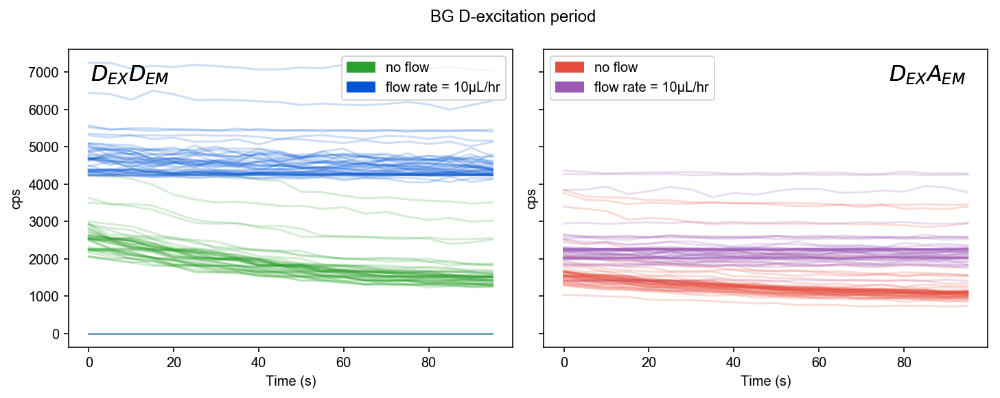

In [57]:
fig, ax = plt.subplots(1, 2, figsize=(12, 4), sharex=True, sharey=True)
fig.suptitle("BG D-excitation period")
t0 = np.arange(len(bg_DexDem_0[0])) * 5
t1 = np.arange(len(bg_DexDem_1[0])) * 5
ax[0].plot(t0, np.array(bg_DexDem_0).T, color=green, alpha=0.2)
ax[1].plot(t0, np.array(bg_DexAem_0).T, color=red, alpha=0.2)
ax[0].plot(t1, np.array(bg_DexDem_1).T, color=blue, alpha=0.2)
ax[1].plot(t1, np.array(bg_DexAem_1).T, color=purple, alpha=0.2)
plt.setp(ax, xlabel='Time (s)', ylabel='cps')
plt.subplots_adjust(wspace=0.07)
ax[0].text(0.05, 0.95, '$D_{EX}D_{EM}$', va='top', fontsize=16, transform=ax[0].transAxes)
ax[1].text(0.95, 0.95, '$D_{EX}A_{EM}$', va='top', ha='right', fontsize=16, transform=ax[1].transAxes)
ax[0].text(0.05, 0.95, '$D_{EX}D_{EM}$', va='top', fontsize=16, transform=ax[0].transAxes)
ax[1].text(0.95, 0.95, '$D_{EX}A_{EM}$', va='top', ha='right', fontsize=16, transform=ax[1].transAxes)
ax[0].legend(handles=[green_patch, blue_patch], loc='upper right')
ax[1].legend(handles=[red_patch, purple_patch], loc='upper left')
plt.savefig(f'{save_dir}/{mlabels[0]}_{mlabels[1]}_background_DexDem_DexAem.png', bbox_to_anchor='tight', dpi = 1200);

## Plot interphoton delays

In [58]:
plot_style = dict(marker='o', markersize=1, linestyle='none', alpha=0.6)

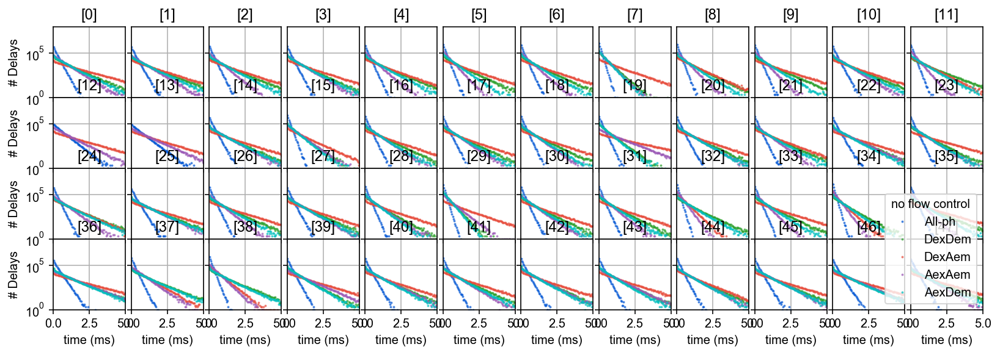

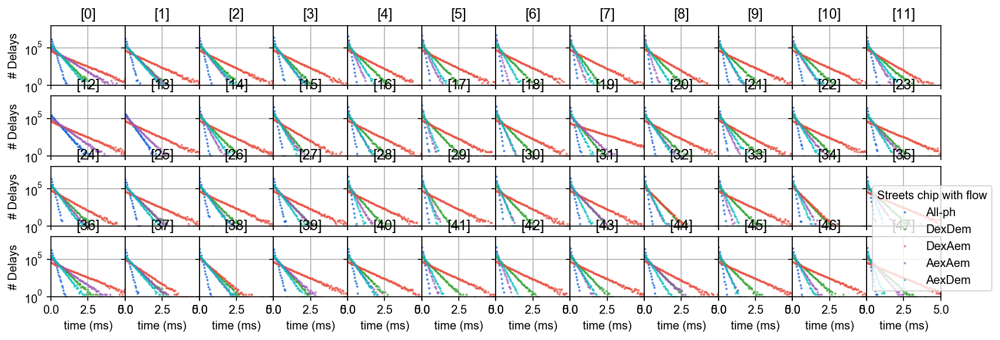

In [59]:
dplot(d0, hist_interphoton, binwidth=50e-6, show_da=True, 
      suptitle=False, hspace=0, wspace=0.08, figsize=(12, 4), 
      legend=True, xrotation=45, plot_style=plot_style)
plt.xlim(50e-6, 5)
plt.ylim(1, 1e8)
plt.legend(title='no flow control')

dplot(d1, hist_interphoton, binwidth=50e-6, show_da=True, 
      suptitle=False, wspace=0, figsize=(12, 4), 
      legend=True, xrotation=45, plot_style=plot_style)
plt.xlim(50e-6, 5)
plt.ylim(1, 1e8)
plt.legend(title='Streets chip with flow');

In [60]:
def _normalize_kwargs(kwargs, kind='patch'):
    """Convert matplotlib keywords from short to long form."""
    if kwargs is None:
        return {}

    if kind == 'line2d':
        long_names = dict(c='color', ls='linestyle', lw='linewidth',
                          mec='markeredgecolor', mew='markeredgewidth',
                          mfc='markerfacecolor', ms='markersize',)
    elif kind == 'patch':
        long_names = dict(c='color', ls='linestyle', lw='linewidth',
                          ec='edgecolor', fc='facecolor',)
    for short_name in long_names:
        if short_name in kwargs:
            kwargs[long_names[short_name]] = kwargs.pop(short_name)
    return kwargs

In [61]:
_ph_sel_color_dict = {Ph_sel('all'): blue, 
                      Ph_sel(Dex='Dem'): green,
                      Ph_sel(Dex='Aem'): red, 
                      Ph_sel(Aex='Aem'): purple,
                      Ph_sel(Aex='Dem'): 'c', }
_ph_sel_label_dict = {Ph_sel('all'): 'All-ph', 
                      Ph_sel(Dex='Dem'): 'DexDem',
                      Ph_sel(Dex='Aem'): 'DexAem', 
                      Ph_sel(Aex='Aem'): 'AexAem',
                      Ph_sel(Aex='Dem'): 'AexDem'}

In [62]:
def hist_interphoton_single(d0, d1, i=0, binwidth=1e-4, tmax=None, bins=None,
                            ph_sel=Ph_sel('all'), period=None,
                            yscale='log', xscale='linear', xunit='ms',
                            plot_style=None):
    
    unit_dict = {'s': 1, 'ms': 1e3, 'us': 1e6, 'ns': 1e9}
    assert xunit in unit_dict
    scalex = unit_dict[xunit]

    # Compute interphoton delays
    if period is None:
        ph0_times = d0.get_ph_times(ich=i, ph_sel=ph_sel)
        ph1_times = d1.get_ph_times(ich=i, ph_sel=ph_sel)
    else:
        ph0_times = d0.get_ph_times_period(ich=i, period=period, ph_sel=ph_sel)
        ph1_times = d1.get_ph_times_period(ich=i, period=period, ph_sel=ph_sel)
    delta_ph0_t = np.diff(ph0_times) * d0.clk_p
    delta_ph1_t = np.diff(ph1_times) * d1.clk_p
    if tmax is None:
        tmax0 = delta_ph0_t.max()
        tmax1 = delta_ph1_t.max()
        
    # Compute bin edges if not passed in
    if bins is None:
        # Shift by half clk_p to avoid "beatings" in the distribution
        # due to floating point inaccuracies.
        bins0 = np.arange(0, tmax0 + binwidth, binwidth) - 0.5 * d0.clk_p
        bins1 = np.arange(0, tmax1 + binwidth, binwidth) - 0.5 * d1.clk_p
    else:
        warnings.warn('Using `bins` and ignoring `tmax` and `binwidth`.')
    t0_ax = bins0[:-1] + 0.5 * binwidth
    t1_ax = bins1[:-1] + 0.5 * binwidth

    # Compute interphoton histogram
    counts0, _ = np.histogram(delta_ph0_t, bins=bins0)
    counts1, _ = np.histogram(delta_ph1_t, bins=bins1)

    # Max index with counts > 0
    n0_trim = np.trim_zeros(counts0).size + 1
    n1_trim = np.trim_zeros(counts1).size + 1

    # Plot histograms
    plot_style_ = dict(lw=4, alpha=0.7)
    
    #if ph_sel in _ph_sel_color_dict:
        #plot_style_['color'] = _ph_sel_color_dict[ph_sel]
        #plot_style_['label'] = _ph_sel_label_dict[ph_sel]
    
    plot_style_.update(_normalize_kwargs(plot_style, kind='line2d'))
    plot(t0_ax[:n0_trim] * scalex, counts0[:n0_trim], **plot_style_)
    plot(t1_ax[:n1_trim] * scalex, counts1[:n1_trim], **plot_style_)

    if yscale == 'log':
        gca().set_yscale(yscale)
        plt.ylim(1)
        _plot_status['hist_interphoton_single'] = {'autoscale': False}
    if xscale == 'log':
        gca().set_xscale(yscale)
        plt.xlim(0.5 * binwidth)
        _plot_status['hist_interphoton_single'] = {'autoscale': False}
    plt.xlabel('Inter-photon delays (%s)' % xunit.replace('us', 'μs'))
    plt.ylabel('# Delays')
    # Return internal variables so that other functions can extend the plot
    return dict(counts0=counts0, counts1=counts1, n0_trim=n0_trim, n1_trim=n1_trim, plot_style_=plot_style_,
                t0_ax=t0_ax, t1_ax=t1_ax, scalex=scalex)

In [63]:
def hist_interphoton(d0, d1, i=0, binwidth=1e-4, tmax=None, bins=None, period=None,
                     yscale='log', xscale='linear', xunit='ms', plot_style=None,
                     show_da=False, legend=True):
   
    # Plot multiple timetraces
    ph_sel_list = [Ph_sel('all'), Ph_sel(Dex='Dem'), Ph_sel(Dex='Aem')]
    if d0.alternated:
        ph_sel_list.append(Ph_sel(Aex='Aem'))
        if show_da:
            ph_sel_list.append(Ph_sel(Aex='Dem'))

    for ix, ph_sel in enumerate(ph_sel_list):
        if not bl.mask_empty(d0.get_ph_mask(i, ph_sel=ph_sel)):
            hist_interphoton_single(d0, d1, i=i, binwidth=binwidth, tmax=None, bins=None, 
                                    period=period, ph_sel=ph_sel,
                                    yscale=yscale, xscale=xscale, xunit=xunit,
                                    plot_style=plot_style)
            
            
            
    if legend:
        plt.legend(loc='best')

    if yscale == 'log' or xscale == 'log':
        _plot_status['hist_interphoton'] = {'autoscale': False}


In [64]:
legend_list = ['All-ph: no flow', 
               'All-ph: Streets chip with flow', 
               'DexDem: no flow', 
               'DexDem: Streets chip with flow', 
               'DexAem: no flow', 
               'DexAem: Streets chip with flow',
               'AexAem: no flow', 
               'AexAem: Streets chip with flow']

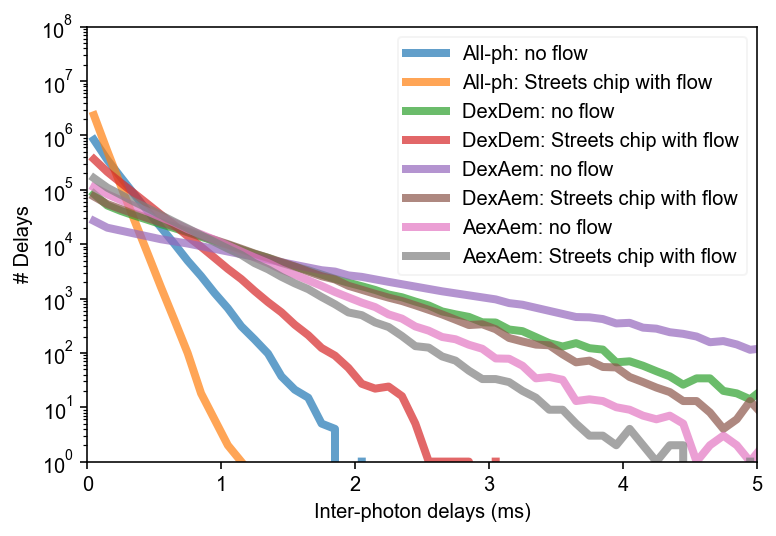

In [65]:
hist_interphoton(d0, d1, i=0, binwidth=1e-4, tmax=None, bins=None, period=None,
                     yscale='log', xscale='linear', xunit='ms', plot_style=None,
                     show_da=False)
plt.xlim(50e-6, 5)
plt.ylim(1, 1e8)
plt.legend(legend_list, framealpha=0.2)
plt.savefig(f'{save_dir}/{mlabels[0]}_{mlabels[1]}_interphoton_delay_distribution_nt.png', 
            bbox_to_anchor='tight', dpi = 1200);

# Burst searches

In order to compare the control measurement without flow to the measurement acquired with the Streets chip under flow conditions at differing powers, it is necessary to adjust the burst searchers. 
1. Burst search using a fixed threshold
    - 50 kcps for control sample without flow
    - 75 kcps for sample with flow

In [66]:
Dex0 = d0.setup['excitation_input_powers'][0] * 1e3
Dex1 = d1.setup['excitation_input_powers'][0] * 1e3
Aex0 = d0.setup['excitation_input_powers'][1] * 1e3
Aex1 = d1.setup['excitation_input_powers'][1] * 1e3
power0 = f'D{Dex0:.0f}mW_A{Aex0:.0f}mW'
power1 = f'D{Dex1:.0f}mW_A{Aex1:.0f}mW'
power0, power1 

('D300mW_A600mW', 'D500mW_A800mW')

In [67]:
Dex_ratio = 300 / 500 # [mW]
Aex_ratio = 600 / 800 # [mW]
Dex_ratio, Aex_ratio

(0.6, 0.75)

In [68]:
cps_ratio = np.mean((50e3 / Dex_ratio, 50e3 / Aex_ratio))
cps_ratio

75000.0

**Compare burst search results for measurement with and without flow**
  
1. No flow control, th = 50kcps
2. Streets chip with flow, th=80kcps


In [69]:
bsearch_params_constant_50kcps = dict(m=10, ph_sel=Ph_sel('all'), pax=True, min_rate_cps=50_000) #d0, no flow
bsearch_params_constant_75kcps = dict(m=10, ph_sel=Ph_sel('all'), pax=True, min_rate_cps=75_000) #d2, with flow

In [70]:
d2 = d1.copy() #with flow, 80kcps 

Deep copy executed.


In [71]:
d_list = [d0, d2]
d_list

[05_-8TA_-3NTD_500pM G1.000 BGexp-10sslice,
 06_-8TA_-3NTD_500pM_ASchip G1.000 BGexp-10sslice]

In [72]:
d0.burst_search(**bsearch_params_constant_50kcps) # no flow
d2.burst_search(**bsearch_params_constant_75kcps) # with flow 

 - Performing burst search (verbose=False) ...[DONE]
 - Calculating burst periods ...[DONE]
 - Counting D and A ph and calculating FRET ... 
   - Applying background correction.
   [DONE Counting D/A]
 - Performing burst search (verbose=False) ...[DONE]
 - Calculating burst periods ...[DONE]
 - Counting D and A ph and calculating FRET ... 
   - Applying background correction.
   [DONE Counting D/A]


In [73]:
d0.calc_max_rate(m=bsearch_params_constant_50kcps['m'])
d2.calc_max_rate(m=bsearch_params_constant_75kcps['m'])

In [74]:
fig_name_50kcps = f'{save_dir}/{f0}_bsearch_params'
for k, v in bsearch_params_constant_50kcps.items():
    fig_name_50kcps += f'_{k}_{v}'
fig_name_50kcps

'./figures/05_-8TA_-3NTD_500pM_bsearch_params_m_10_ph_sel_all_pax_True_min_rate_cps_50000'

In [75]:
fig_name_75kcps = f'{save_dir}/{f1}_bsearch_params'
for k, v in bsearch_params_constant_75kcps.items():
    fig_name_75kcps += f'_{k}_{v}'
fig_name_75kcps

'./figures/06_-8TA_-3NTD_500pM_ASchip_bsearch_params_m_10_ph_sel_all_pax_True_min_rate_cps_75000'

# Burst size distributions

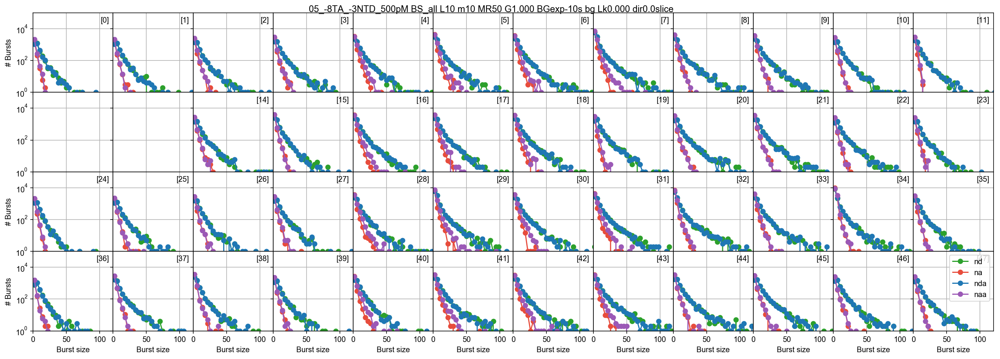

In [76]:
kws = dict(skip_ch=skip_ch, hspace=0, wspace=0, top=0.96, 
           title_bg=False, title_nbursts=False, title='in')

dplot(d0, hist_size_all, **kws)
plt.xlim(0, 120)
plt.ylim(1, 1e5)
plt.legend()
plt.savefig(f'{fig_name_50kcps}_burst_size_all_ph-streams_48spots.png', 
            bbox_to_anchor='tight', dpi = 1200);

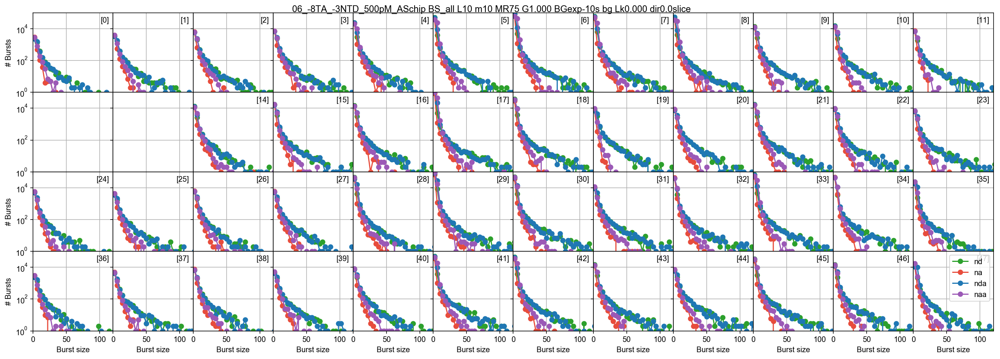

In [77]:
kws = dict(skip_ch=skip_ch, hspace=0, wspace=0, top=0.96, 
           title_bg=False, title_nbursts=False, title='in')

dplot(d2, hist_size_all, **kws)
plt.xlim(0, 120)
plt.ylim(1, 1e5)
plt.legend()
plt.savefig(f'{fig_name_75kcps}_burst_size_all_ph-streams_48spots.png', 
            bbox_to_anchor='tight', dpi = 1200);

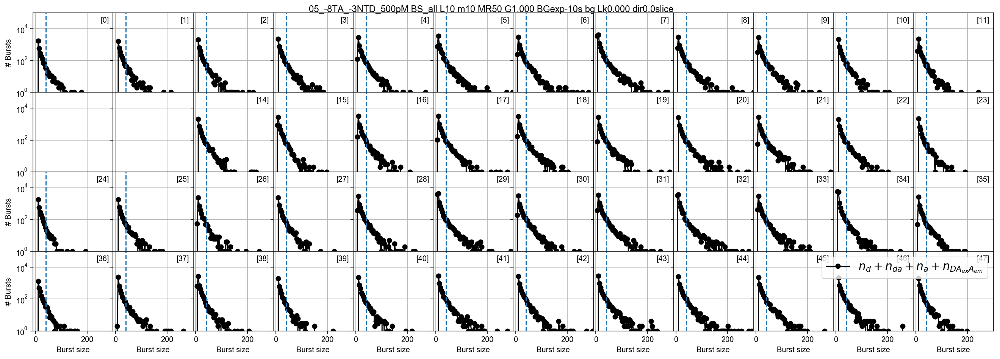

In [78]:
size_th = 40
size_sel_kws = dict(ph_sel=Ph_sel(Dex='DAem', Aex='DAem'),
                    na_comp=False, naa_comp=False, naa_aexonly=False)
dplot(d0, hist_size, vline=size_th, **size_sel_kws, **kws);
plt.xlim(-10, 300)
plt.ylim(1, 1e5)
plt.legend(fontsize=15, loc='upper right')
Math(d0._burst_sizes_pax_formula(**size_sel_kws))
plt.savefig(f'{fig_name_50kcps}_burst_size_all_photons_48spots.png', 
            bbox_to_anchor='tight', dpi = 1200);

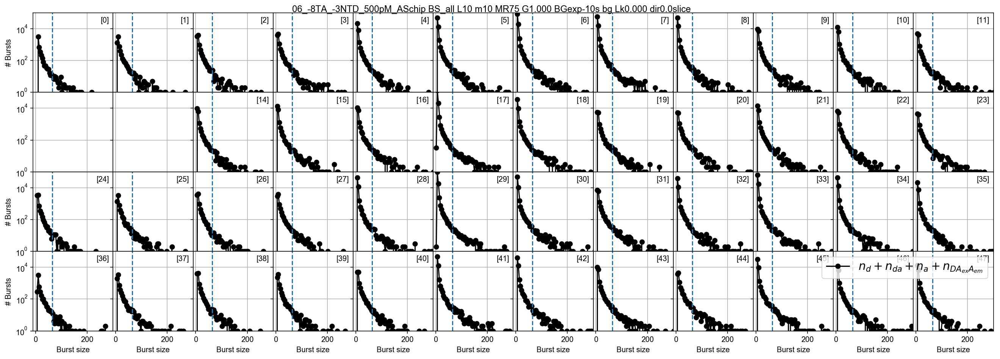

In [79]:
size_th = 64
size_sel_kws = dict(ph_sel=Ph_sel(Dex='DAem', Aex='DAem'),
                    na_comp=False, naa_comp=False, naa_aexonly=False)
dplot(d2, hist_size, vline=size_th, **size_sel_kws, **kws);
plt.xlim(-10, 300)
plt.ylim(1, 1e5)
plt.legend(fontsize=15, loc='upper right')
Math(d2._burst_sizes_pax_formula(**size_sel_kws))
plt.savefig(f'{fig_name_75kcps}_burst_size_all_photons_48spots.png', 
            bbox_to_anchor='tight', dpi = 1200);

In [80]:
bs_mean_50kcps = []
bs_mean_75kcps = []

for i in range(48):
    sizes_ch = d0.burst_sizes_pax_ich(i, **size_sel_kws) 
    tail = sizes_ch > size_th
    bs_mean_50kcps.append(sizes_ch[tail].mean() - size_th)
    
for i in range(48):
    sizes_ch = d2.burst_sizes_pax_ich(i, **size_sel_kws) 
    tail = sizes_ch > size_th
    bs_mean_75kcps.append(sizes_ch[tail].mean() - size_th)

/Users/maya/anaconda3/envs/py37-fb/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: Mean of empty slice.
  import sys
/Users/maya/anaconda3/envs/py37-fb/lib/python3.7/site-packages/numpy/core/_methods.py:85: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


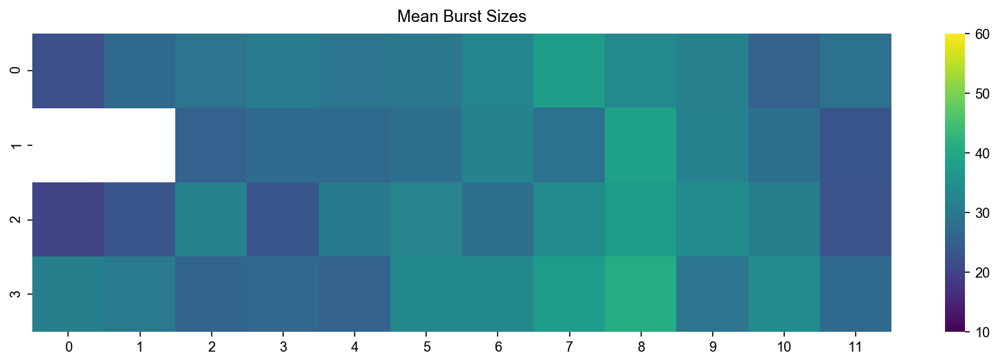

In [81]:
heatmap48(bs_mean_50kcps, cmap='viridis', skip_ch=skip_ch,
          title="Mean Burst Sizes", vmin=10, vmax=60)
plt.savefig(f'{fig_name_50kcps}_heatmap_burst_sizes.png', 
            bbox_to_anchor='tight', dpi = 1200);

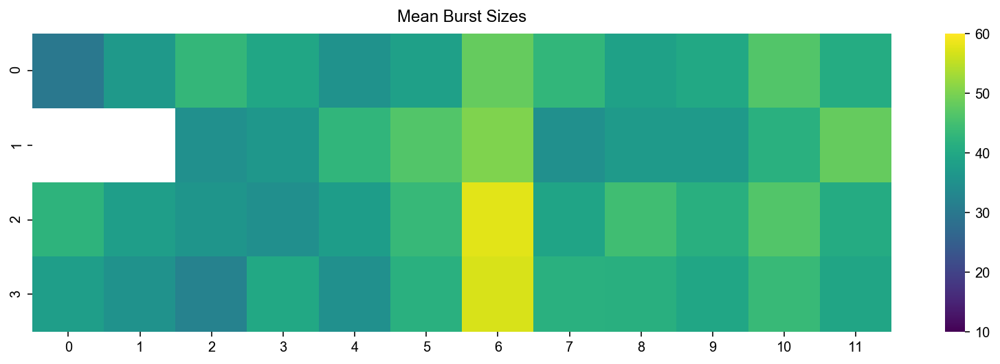

In [82]:
heatmap48(bs_mean_75kcps, cmap='viridis', skip_ch=skip_ch,
          title="Mean Burst Sizes", vmin=10, vmax=60)
plt.savefig(f'{fig_name_75kcps}_heatmap_burst_sizes.png', 
            bbox_to_anchor='tight', dpi = 1200);

# Burst duration distribution 

In [83]:
width_nf_th = 0.4
width_f_th = 0.4

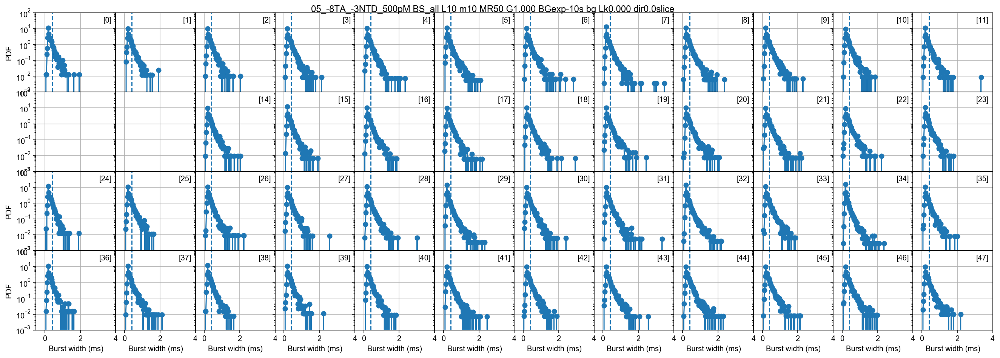

In [84]:
dplot(d0, hist_width, vline=width_nf_th, **kws);
plt.xlim(-0.5, 4)
plt.ylim(1e-3, 1e2)
plt.savefig(f'{fig_name_50kcps}_burst_duration_all_photons_48spots.png', 
            bbox_to_anchor='tight', dpi = 1200);

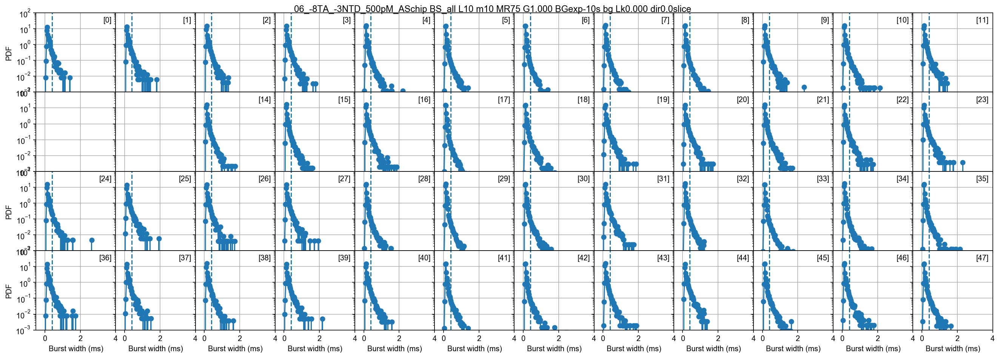

In [85]:
dplot(d2, hist_width, vline=width_f_th, **kws);
plt.xlim(-0.5, 4)
plt.ylim(1e-3, 1e2)
plt.savefig(f'{fig_name_75kcps}_burst_duration_all_photons_48spots.png', 
            bbox_to_anchor='tight', dpi = 1200);

In [86]:
bw_mean_50kcps = []
bw_mean_75kcps = []

for i in range(48):
    widths_ch = d0.mburst[i].width * d0.clk_p * 1e3
    tail = widths_ch > width_nf_th
    bw_mean_50kcps.append(widths_ch[tail].mean() - width_nf_th)
    
for i in range(48):
    widths_ch = d2.mburst[i].width * d2.clk_p * 1e3
    tail = widths_ch > width_f_th
    bw_mean_75kcps.append(widths_ch[tail].mean() - width_f_th)

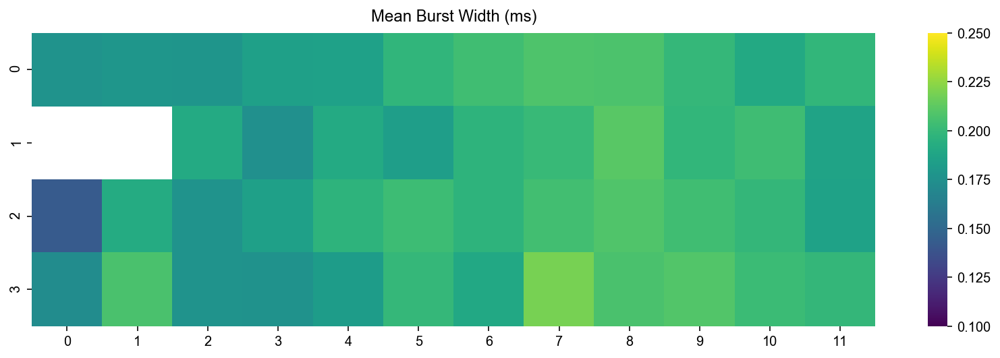

In [87]:
heatmap48(bw_mean_50kcps, cmap='viridis', skip_ch=skip_ch,
          title="Mean Burst Width (ms)", vmin=0.1, vmax=0.25)
plt.savefig(f'{fig_name_50kcps}_heatmap_burst_widths.png', 
            bbox_to_anchor='tight', dpi = 1200);

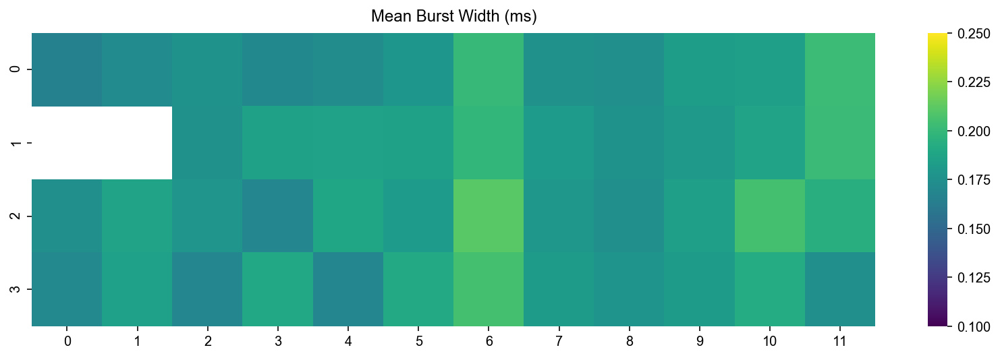

In [88]:
heatmap48(bw_mean_75kcps, cmap='viridis', skip_ch=skip_ch,
          title="Mean Burst Width (ms)", vmin=0.1, vmax=0.25)
plt.savefig(f'{fig_name_75kcps}_heatmap_burst_widths.png', 
            bbox_to_anchor='tight', dpi = 1200);

# Peak photon rate distribution

In [89]:
%run -i cal_phrates.py 

<Figure size 432x288 with 0 Axes>

In [90]:
# Use recompute=True if changing burst-search parameters
recompute = False
phrates = {}
streams = ('all', 'DexDem', 'AexDem', 'DexAem', 'AexAem', )

In [91]:
phrates_50kcps = {}
for stream in streams:
    print(f' - Computing peak photon rates for {Ph_sel.from_str(stream)} stream.')
    cal_phrate(d0, stream=Ph_sel.from_str(stream), 
               bsearch_params=bsearch_params_constant_50kcps, 
               phrates=phrates_50kcps, recompute=recompute)
    

 - Computing peak photon rates for all stream.
   Valid fraction (mean of all ch): 100.0
 - Computing peak photon rates for DexDem stream.
   Valid fraction (mean of all ch): 21.1
 - Computing peak photon rates for AexDem stream.
   Valid fraction (mean of all ch): 21.5
 - Computing peak photon rates for DexAem stream.
   Valid fraction (mean of all ch): 2.5
 - Computing peak photon rates for AexAem stream.
   Valid fraction (mean of all ch): 4.1


In [92]:
phrates_75kcps = {}
for stream in streams:
    print(f' - Computing peak photon rates for {Ph_sel.from_str(stream)} stream.')
    cal_phrate(d2, stream=Ph_sel.from_str(stream), 
               bsearch_params=bsearch_params_constant_75kcps, 
               phrates=phrates_75kcps, recompute=recompute)
    

 - Computing peak photon rates for all stream.
   Valid fraction (mean of all ch): 100.0
 - Computing peak photon rates for DexDem stream.
   Valid fraction (mean of all ch): 6.0
 - Computing peak photon rates for AexDem stream.
   Valid fraction (mean of all ch): 6.9
 - Computing peak photon rates for DexAem stream.
   Valid fraction (mean of all ch): 1.8
 - Computing peak photon rates for AexAem stream.
   Valid fraction (mean of all ch): 5.1


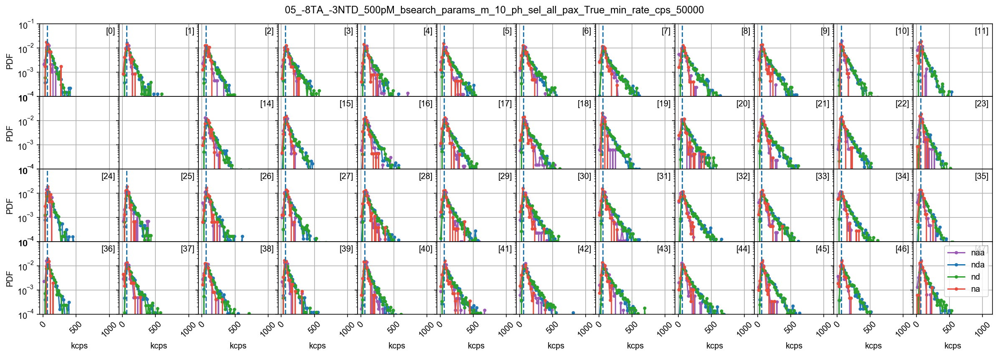

In [93]:
kws = dict(figsize=(18, 6), skip_ch=skip_ch, wspace=0, hspace=0, grid=True, 
           title=None, title_nbursts=False, title_bg=False, xrotation=45)

ax = dplot(phrates_50kcps['AexAemB'], hist_burst_phrate, 
           plot_style=dict(color=bpl.purple, label='naa', ms=3), **kws)
dplot(phrates_50kcps['AexDemB'], hist_burst_phrate, 
      plot_style=dict(color='C0', label='nda', ms=3), AX=ax, **kws)
dplot(phrates_50kcps['DexDemB'], hist_burst_phrate, 
      plot_style=dict(color=bpl.green, label='nd', ms=3), AX=ax, **kws)
kws.update(vline=60, title='in', title_nbursts=False, title_bg=False,)
dplot(phrates_50kcps['DexAemB'], hist_burst_phrate, 
      plot_style=dict(color=bpl.red, label='na', ms=3), AX=ax, **kws)
plt.xlim(-50, 1150)
plt.ylim(1e-4, 1e-1)
plt.setp(ax[:, 0], ylabel='PDF')
plt.setp(ax[-1], xlabel='kcps')
plt.suptitle(f'{fig_name_50kcps[10:]}')
plt.legend()
plt.savefig(f'{fig_name_50kcps}_peak_phrate_all_48spots.png', 
            bbox_to_anchor='tight', dpi = 1200);

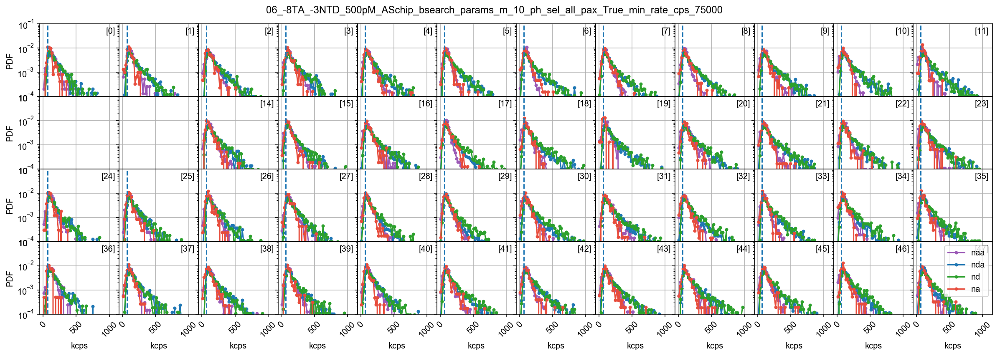

In [94]:
kws = dict(figsize=(18, 6), skip_ch=skip_ch, wspace=0, hspace=0, grid=True, 
           title=None, title_nbursts=False, title_bg=False, xrotation=45)

ax = dplot(phrates_75kcps['AexAemB'], hist_burst_phrate, 
           plot_style=dict(color=bpl.purple, label='naa', ms=3), **kws)
dplot(phrates_75kcps['AexDemB'], hist_burst_phrate, 
      plot_style=dict(color='C0', label='nda', ms=3), AX=ax, **kws)
dplot(phrates_75kcps['DexDemB'], hist_burst_phrate, 
      plot_style=dict(color=bpl.green, label='nd', ms=3), AX=ax, **kws)
kws.update(vline=65, title='in', title_nbursts=False, title_bg=False,)
dplot(phrates_75kcps['DexAemB'], hist_burst_phrate, 
      plot_style=dict(color=bpl.red, label='na', ms=3), AX=ax, **kws)
plt.xlim(-50, 1150)
plt.ylim(1e-4, 1e-1)
plt.setp(ax[:, 0], ylabel='PDF')
plt.setp(ax[-1], xlabel='kcps')
plt.suptitle(f'{fig_name_75kcps[10:]}')
plt.legend()
plt.savefig(f'{fig_name_75kcps}_peak_phrate_all_48spots.png', 
            bbox_to_anchor='tight', dpi = 1200);

# Burst selection


In [95]:
#Size selection on all bursts from the `nd`, `nda`, `na`, and `naa` photon streams

size_nf_th = 40 
size_f_th = 64

size_sel_kws = dict(ph_sel=Ph_sel(Dex='DAem', Aex='DAem'), gamma=1,
                    na_comp=False, naa_comp=False, naa_aexonly=False)
5
Math(d0._burst_sizes_pax_formula(**size_sel_kws))

<IPython.core.display.Math object>

In [96]:
ds0 = d0.select_bursts(select_bursts.size, th1=size_nf_th, **size_sel_kws)
Su = [(nd + na)/(nd + na + naa) for nd, na, naa in zip(ds0.nd, ds0.na, ds0.naa)]
ds0.add(Su=Su)

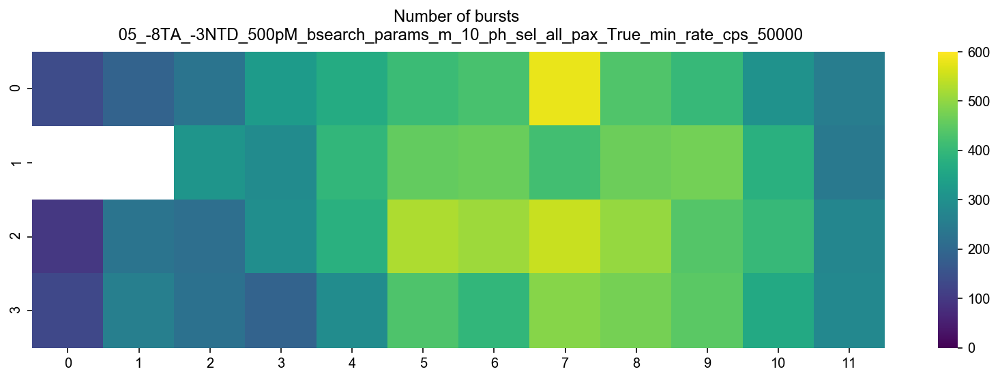

In [97]:
heatmap48(ds0.num_bursts, cmap='viridis', skip_ch=skip_ch,
          title=f"Number of bursts \n {fig_name_50kcps[10:]}", vmin=0, vmax=600)
plt.savefig(f'{fig_name_50kcps}_size_sel_all_{size_nf_th}_heatmap_number_bursts.png', 
            bbox_to_anchor='tight', dpi = 1200);

In [98]:
ds2 = d2.select_bursts(select_bursts.size, th1=size_f_th, **size_sel_kws)
Su = [(nd + na)/(nd + na + naa) for nd, na, naa in zip(ds2.nd, ds2.na, ds2.naa)]
ds2.add(Su=Su)

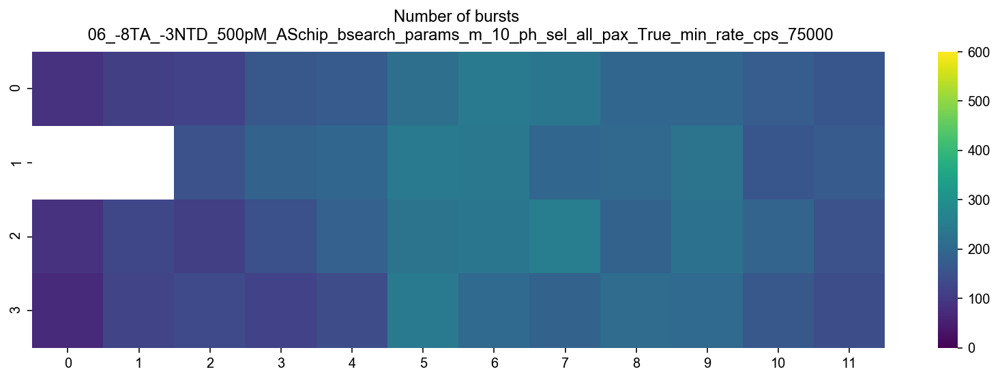

In [99]:
heatmap48(ds2.num_bursts, cmap='viridis', skip_ch=skip_ch,
          title=f"Number of bursts \n {fig_name_75kcps[10:]}", vmin=0, vmax=600)
plt.savefig(f'{fig_name_75kcps}_size_sel_all_{size_f_th}_heatmap_number_bursts.png', 
            bbox_to_anchor='tight', dpi = 1200);

# $E_{PR}-S_u$ histograms

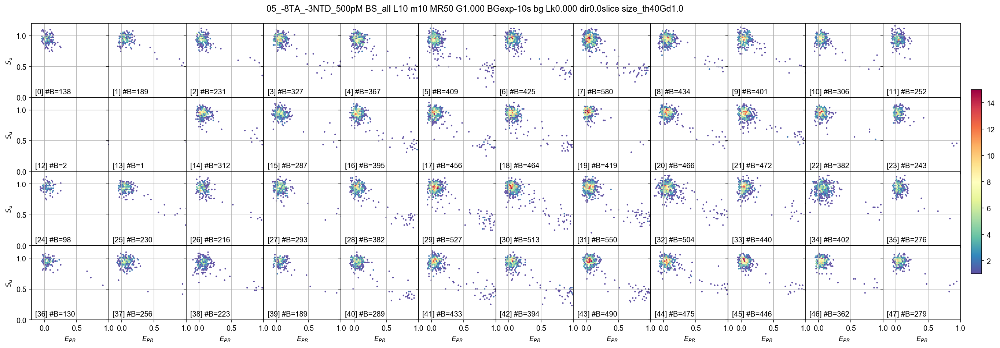

In [100]:
ax = dplot(ds0, hexbin_alex, S_name='Su', vmax=15, 
           wspace=0, hspace=0, gridsize=60, title='bottom left', title_bg=False)
ax0 = ax[0, 0]
fig = ax0.figure
cax = fig.add_axes([0.97, 0.25, 0.01, 0.5])
plt.setp(ax[:, 0], ylabel='$S_u$')
plt.setp(ax[-1], xlabel='$E_{PR}$')
plt.colorbar(cax=cax)
ax0.set_xticks([0, 0.5, 1])
ax0.set_yticks([0, 0.5, 1])
ax0.set_xlim(-0.2, 1)
ax0.set_ylim(0, 1.2)
plt.savefig(f'{fig_name_50kcps}_size_sel_{size_nf_th}_alex_hist_Su_size_48spots.png', 
            bbox_to_anchor='tight', dpi = 1200);

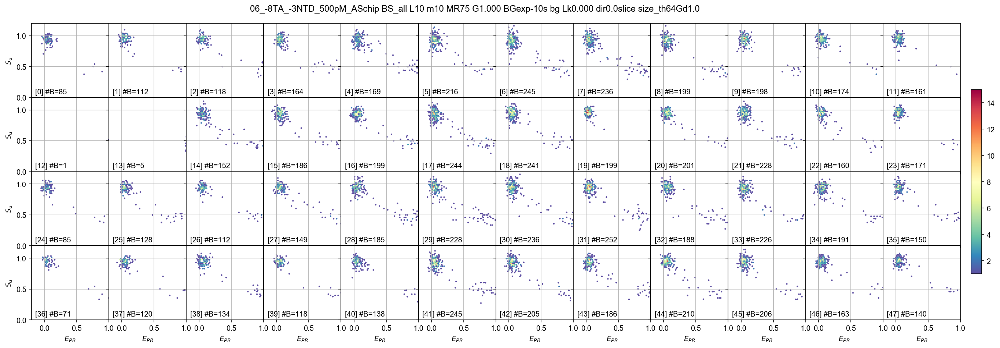

In [101]:
ax = dplot(ds2, hexbin_alex, S_name='Su', vmax=15, 
           wspace=0, hspace=0, gridsize=60, title='bottom left', title_bg=False);
ax0 = ax[0, 0]
fig = ax0.figure
cax = fig.add_axes([0.97, 0.25, 0.01, 0.5])
plt.setp(ax[:, 0], ylabel='$S_u$');
plt.setp(ax[-1], xlabel='$E_{PR}$');
plt.colorbar(cax=cax)
ax0.set_xticks([0, 0.5, 1])
ax0.set_yticks([0, 0.5, 1]);
ax0.set_xlim(-0.2, 1)
ax0.set_ylim(0, 1.2);
plt.savefig(f'{fig_name_75kcps}_size_sel_{size_f_th}_alex_hist_Su_size_48spots.png', 
            bbox_to_anchor='tight', dpi = 1200);

# Burst statistics 

## Burst size

In [147]:
kws = dict(figsize=(18, 6), skip_ch=skip_ch, wspace=0, hspace=0, grid=True, 
           title=None, title_nbursts=False, title_bg=False, xrotation=45, color='k')

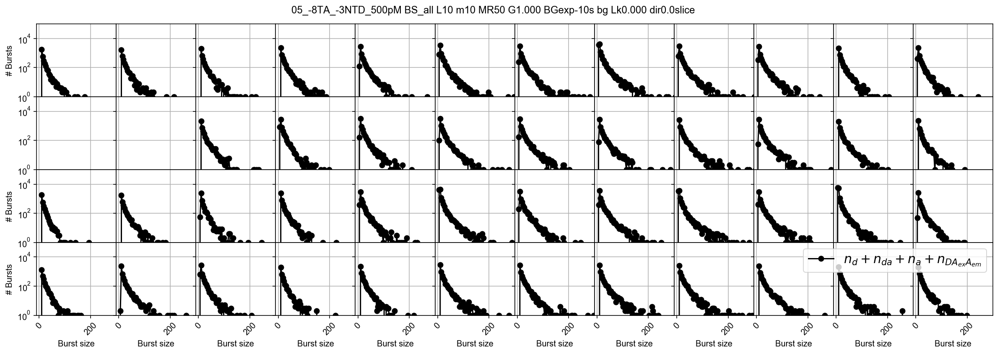

In [148]:
size_sel_kws = dict(ph_sel=Ph_sel(Dex='DAem', Aex='DAem'),
                    na_comp=False, naa_comp=False, naa_aexonly=False)
dplot(d0, hist_size, **size_sel_kws, **kws);
plt.xlim(-10, 300)
plt.ylim(1, 1e5)
plt.legend(fontsize=15, loc='upper right')
Math(d0._burst_sizes_pax_formula(**size_sel_kws))
plt.savefig(f'{fig_name_50kcps}_burst_size_all_photons_size_sel_{size_nf_th}_48spots.png', 
            bbox_to_anchor='tight', dpi = 1200);

In [104]:
kws = dict(figsize=(18, 6), skip_ch=skip_ch, wspace=0, hspace=0, grid=True, 
           title=None, title_nbursts=False, title_bg=False, xrotation=45, color='r')

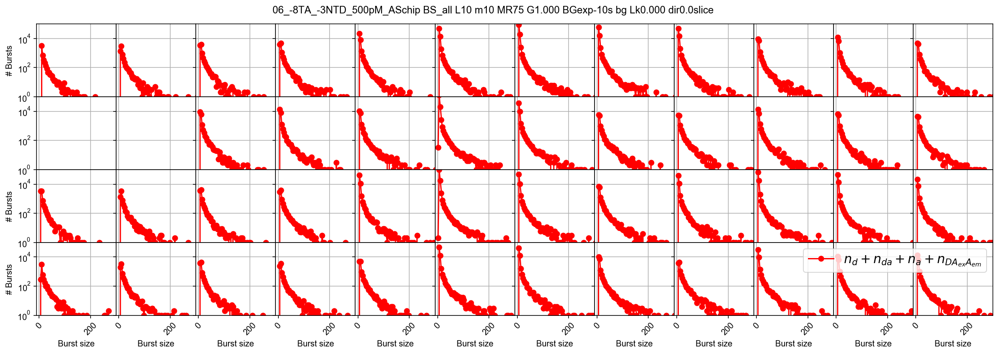

In [105]:
size_sel_kws = dict(ph_sel=Ph_sel(Dex='DAem', Aex='DAem'),
                    na_comp=False, naa_comp=False, naa_aexonly=False)
dplot(d2, hist_size, **size_sel_kws, **kws);
plt.xlim(-10, 300)
plt.ylim(1, 1e5)
plt.legend(fontsize=15, loc='upper right')
Math(d2._burst_sizes_pax_formula(**size_sel_kws))
plt.savefig(f'{fig_name_75kcps}_burst_size_all_photons_size_sel_{size_f_th}_48spots.png', 
            bbox_to_anchor='tight', dpi = 1200);

# Collapse

Pooling data from all 48 spots

In [110]:
df0 = d0.fuse_bursts(ms=0)
df2 = d2.fuse_bursts(ms=0)

 - - - - - CHANNEL  1 - - - - 
 --> END Fused 851 bursts (26.5%, 7 iter)

 - - - - - CHANNEL  2 - - - - 
 --> END Fused 842 bursts (25.0%, 9 iter)

 - - - - - CHANNEL  3 - - - - 
 --> END Fused 950 bursts (24.3%, 7 iter)

 - - - - - CHANNEL  4 - - - - 
 --> END Fused 1149 bursts (25.0%, 10 iter)

 - - - - - CHANNEL  5 - - - - 
 --> END Fused 1463 bursts (26.3%, 8 iter)

 - - - - - CHANNEL  6 - - - - 
 --> END Fused 1801 bursts (25.5%, 11 iter)

 - - - - - CHANNEL  7 - - - - 
 --> END Fused 1534 bursts (25.0%, 10 iter)

 - - - - - CHANNEL  8 - - - - 
 --> END Fused 2864 bursts (25.2%, 12 iter)

 - - - - - CHANNEL  9 - - - - 
 --> END Fused 1603 bursts (25.2%, 8 iter)

 - - - - - CHANNEL 10 - - - - 
 --> END Fused 1408 bursts (24.8%, 8 iter)

 - - - - - CHANNEL 11 - - - - 
 --> END Fused 1090 bursts (24.8%, 8 iter)

 - - - - - CHANNEL 12 - - - - 
 --> END Fused 1151 bursts (25.1%, 10 iter)

 - - - - - CHANNEL 13 - - - - 
 --> END Fused 50 bursts (21.1%, 4 iter)

 - - - - - CHANNEL 14 - -

In [111]:
dc0 = d0.collapse(update_gamma=False)
dc2 = d2.collapse(update_gamma=False)

In [112]:
# check that chi_ch is set to 1 here
dc0.chi_ch, dc2.chi_ch

(1.0, 1.0)

In [113]:
burst_sums = []

for d in d_list:
    sum = d.num_bursts.sum()
    burst_sums.append(sum)
    
burst_sums

[260600, 1605305]

## Burst selection matrix

In [114]:
dcs0 = ds0.collapse(update_gamma=False)
dcs2 = ds2.collapse(update_gamma=False)

In [115]:
naa_sel_kws = dict(ph_sel=Ph_sel(Aex='Aem'), gamma=1,
                   na_comp=False, naa_comp=False, naa_aexonly=False)

Math(d._burst_sizes_pax_formula(**naa_sel_kws))

<IPython.core.display.Math object>

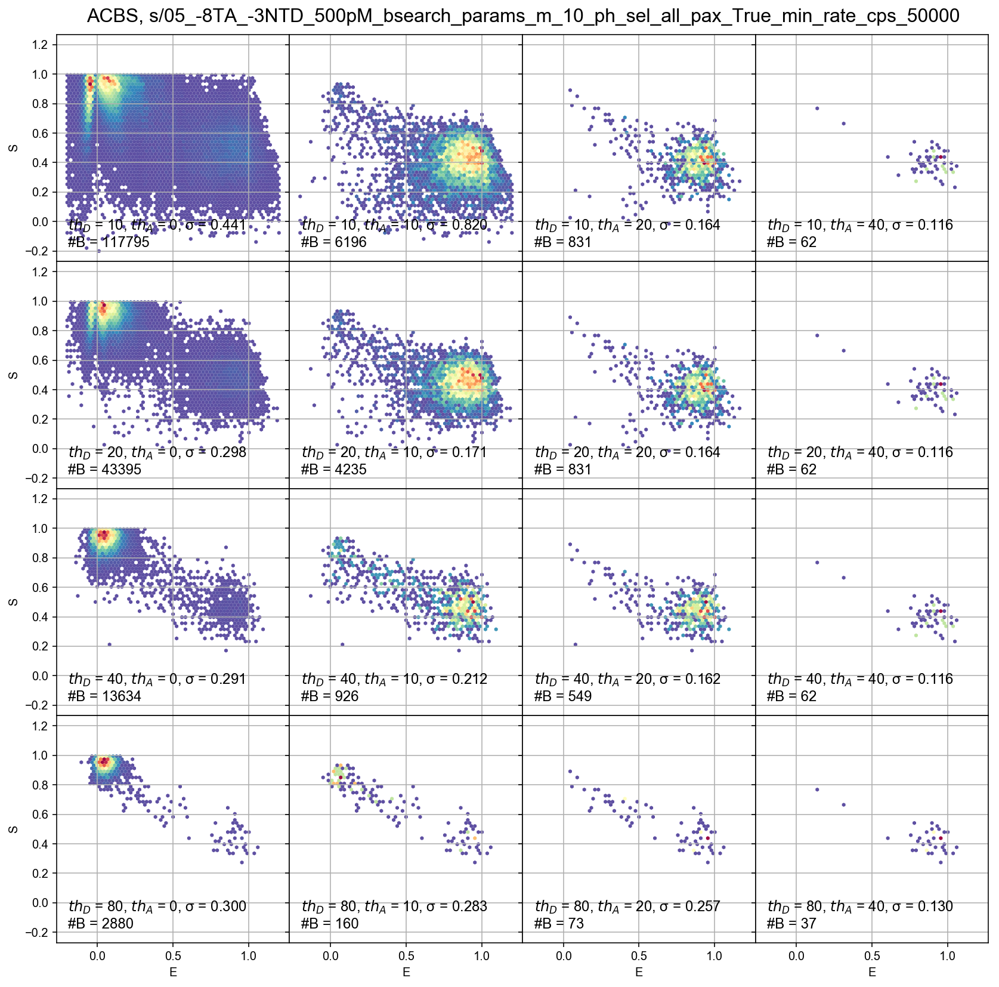

In [116]:
Th = (10, 20, 40, 80)
Th_naa = np.array((0, 10, 20, 40)) 
fig, AX = plt.subplots(len(Th), len(Th_naa), figsize=(3.5*len(Th_naa), 3.5*len(Th)), sharex=True, sharey=True)
for irow, th in enumerate(Th):
    for icol, th_naa in enumerate(Th_naa):
        ax = AX[irow,icol]
        ds0 = d0.select_bursts(select_bursts.size, th1=th_naa, **naa_sel_kws)
        dss0 = ds0.select_bursts(select_bursts.size, th1=th, **size_sel_kws)
        dcss0 = dss0.collapse(update_gamma=False)
        Su = [(nd + na)/(nd + na + naa) for nd, na, naa in zip(dcss0.nd, dcss0.na, dcss0.naa)]
        dcss0.add(Su=Su)
        E = dcss0.E[0]
        E_std = E[E > 0.2].std()
        dplot(dcss0, hexbin_alex, S_name='Su', gridsize=60, ax=ax)
        ax.text(0.05, 0.05, '$th_D$ = %d, $th_A$ = %d, σ = %.3f\n#B = %d' % (th, th_naa, E_std, dcss0.num_bursts), 
                va='bottom', ha='left', transform=ax.transAxes, fontsize=12)
        ax.set_title('')
plt.setp(AX[:-1], xlabel='')
plt.setp(AX[:, 1:], ylabel='')
plt.subplots_adjust(hspace=0, wspace=0)
plt.text(0.15, 0.89, f'ACBS, {fig_name_50kcps[8:]}', transform=fig.transFigure, fontsize=16)
plt.savefig(f'{fig_name_50kcps}_ACBS_size_sel_matrix_alex_hist_Su_48spot.png', 
            bbox_to_anchor='tight', dpi = 1200);

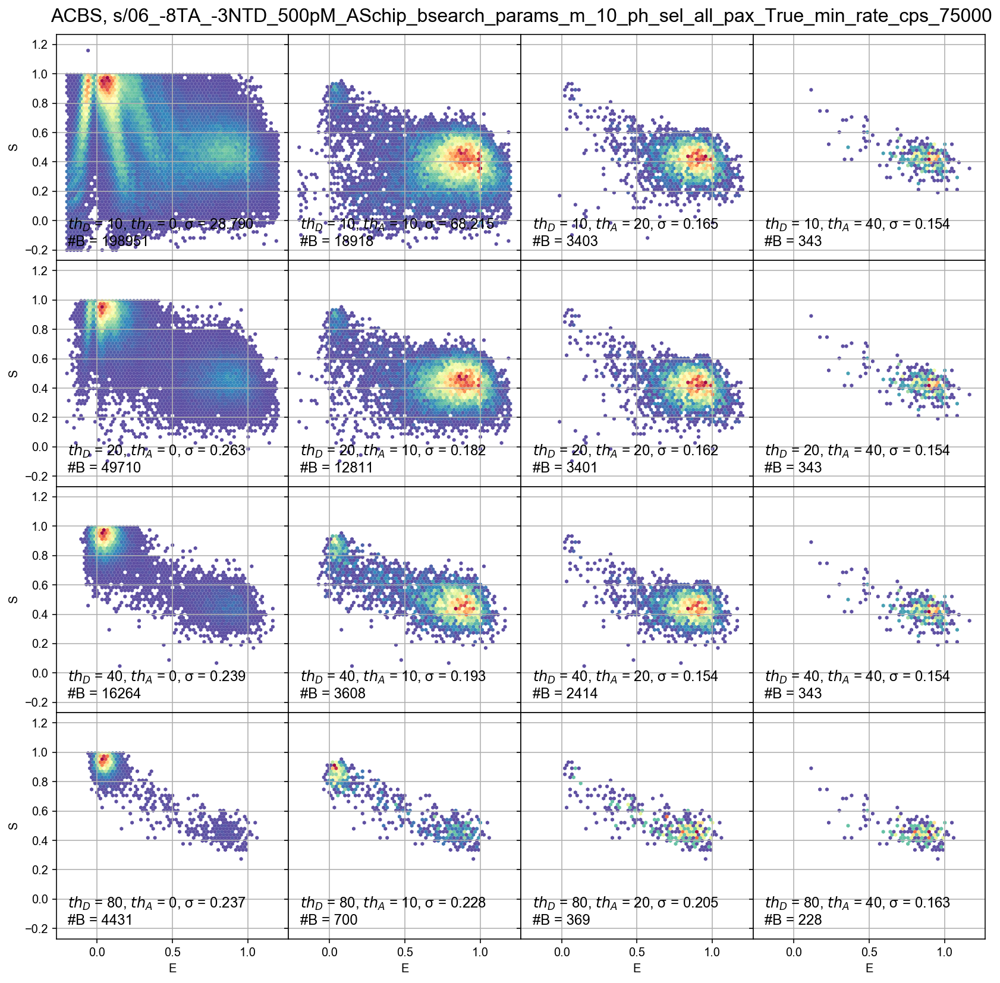

In [117]:
Th = (10, 20, 40, 80)
Th_naa = np.array((0, 10, 20, 40)) 
fig, AX = plt.subplots(len(Th), len(Th_naa), figsize=(3.5*len(Th_naa), 3.5*len(Th)), sharex=True, sharey=True)
for irow, th in enumerate(Th):
    for icol, th_naa in enumerate(Th_naa):
        ax = AX[irow,icol]
        ds2 = d2.select_bursts(select_bursts.size, th1=th_naa, **naa_sel_kws)
        dss2 = ds2.select_bursts(select_bursts.size, th1=th, **size_sel_kws)
        dcss2 = dss2.collapse(update_gamma=False)
        Su = [(nd + na)/(nd + na + naa) for nd, na, naa in zip(dcss2.nd, dcss2.na, dcss2.naa)]
        dcss2.add(Su=Su)
        E = dcss2.E[0]
        E_std = E[E > 0.2].std()
        dplot(dcss2, hexbin_alex, S_name='Su', gridsize=60, ax=ax)
        ax.text(0.05, 0.05, '$th_D$ = %d, $th_A$ = %d, σ = %.3f\n#B = %d' % (th, th_naa, E_std, dcss2.num_bursts), 
                va='bottom', ha='left', transform=ax.transAxes, fontsize=12)
        ax.set_title('')
plt.setp(AX[:-1], xlabel='')
plt.setp(AX[:, 1:], ylabel='')
plt.subplots_adjust(hspace=0, wspace=0)
plt.text(0.12, 0.89, f'ACBS, {fig_name_75kcps[8:]}', transform=fig.transFigure, fontsize=16)
plt.savefig(f'{fig_name_75kcps}_ACBS_size_sel_matrix_alex_hist_Su_48spot.png', 
            bbox_to_anchor='tight', dpi = 1200);

## Pooled $E_{PR} - S_u$ histograms 

In [118]:
dcs0 = dc0.select_bursts(select_bursts.size, th1=size_nf_th, **size_sel_kws)
Su = [(nd + na)/(nd + na + naa) for nd, na, naa in zip(dcs0.nd, dcs0.na, dcs0.naa)]
dcs0.add(Su=Su)

In [119]:
dcs2 = dc2.select_bursts(select_bursts.size, th1=size_f_th, **size_sel_kws)
Su = [(nd + na)/(nd + na + naa) for nd, na, naa in zip(dcs2.nd, dcs2.na, dcs2.naa)]
dcs2.add(Su=Su)

/Users/maya/anaconda3/envs/py37-fb/lib/python3.7/site-packages/seaborn/axisgrid.py:1847: UserWarning: JointGrid annotation is deprecated and will be removed in a future release.
  warnings.warn(UserWarning(msg))
/Users/maya/anaconda3/envs/py37-fb/lib/python3.7/site-packages/seaborn/axisgrid.py:1847: UserWarning: JointGrid annotation is deprecated and will be removed in a future release.
  warnings.warn(UserWarning(msg))


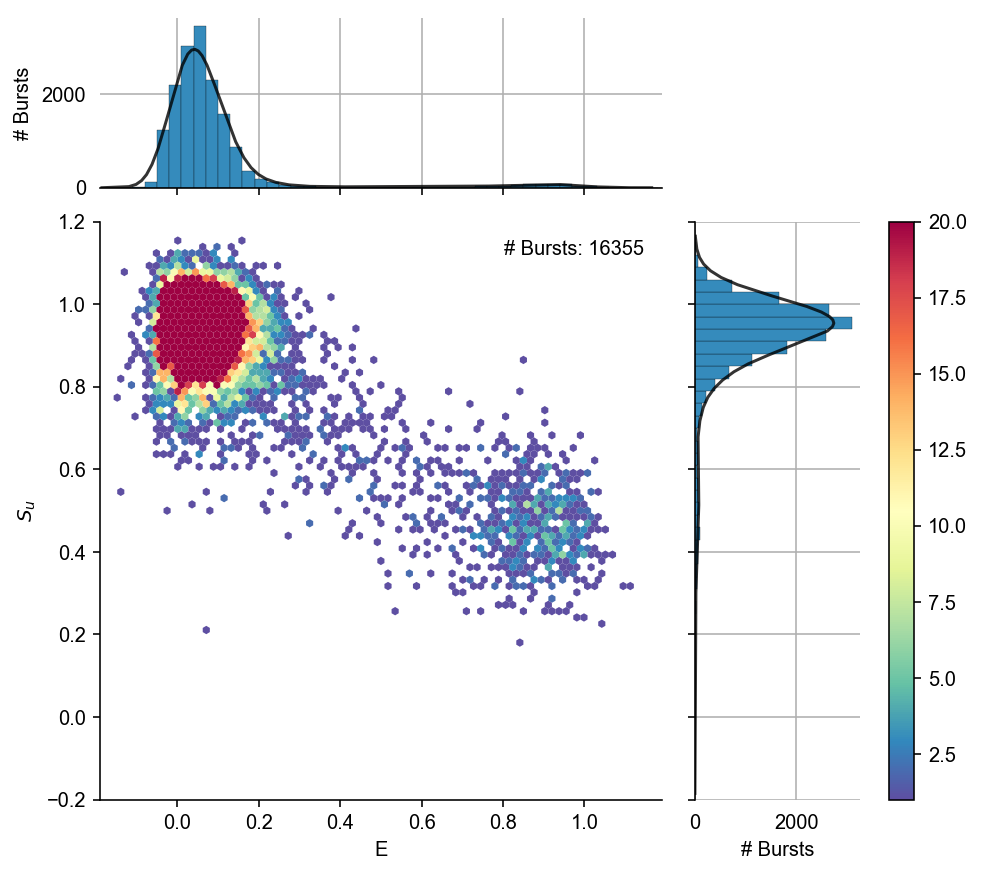

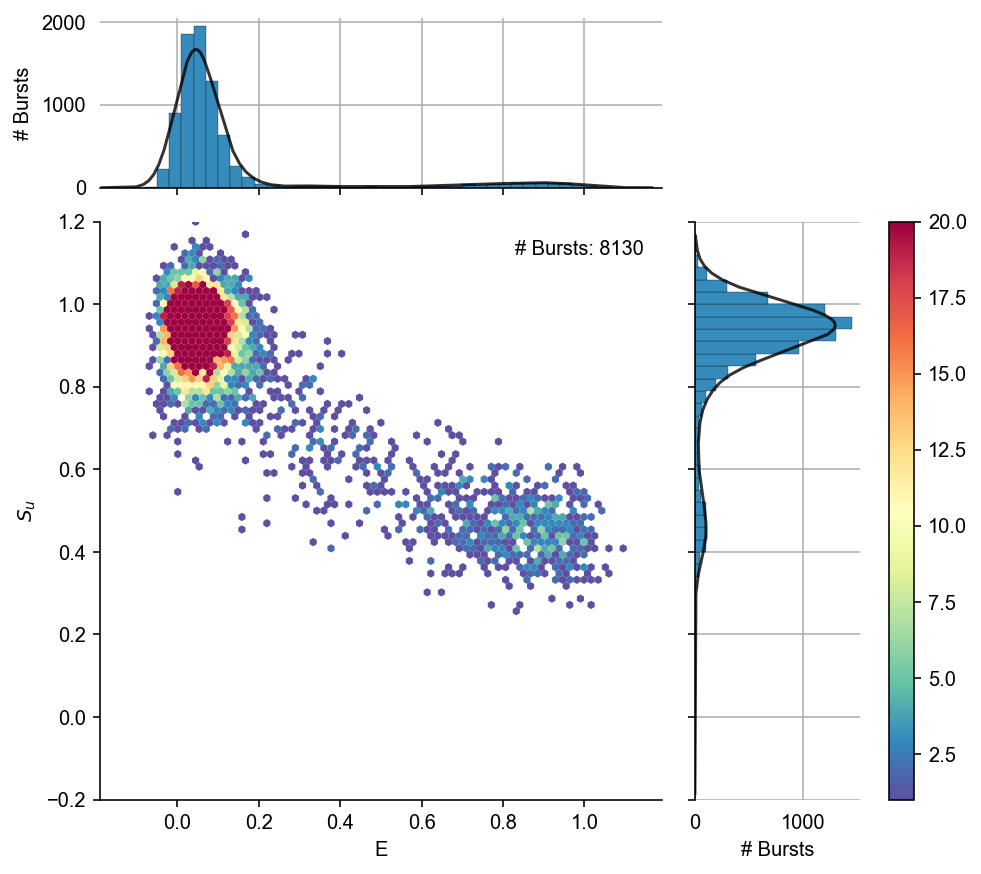

In [120]:
g = alex_jointplot(dcs0, S_name='Su', vmax=20, gridsize=80)
g.ax_joint.set_ylabel('$S_u$')
plt.savefig(f'{fig_name_50kcps}_Dex_th_{size_nf_th}_alex_hist_Su_48spot.png', 
            bbox_to_anchor='tight', dpi = 1200)
g = alex_jointplot(dcs2, S_name='Su', vmax=20, gridsize=80)
g.ax_joint.set_ylabel('$S_u$')
plt.savefig(f'{fig_name_75kcps}_Dex_th_{size_f_th}_alex_hist_Su_48spot.png', 
            bbox_to_anchor='tight', dpi = 1200)

### Calculate number of FRET bursts and D-only bursts

In [185]:
size_Aex = 15
naa_sel_kws = dict(ph_sel=Ph_sel(Aex='Aem'), gamma=1,
                   na_comp=False, naa_comp=False, naa_aexonly=False)

Math(d0._burst_sizes_pax_formula(**naa_sel_kws))

<IPython.core.display.Math object>

In [186]:
dcss0 = dcs0.select_bursts(select_bursts.size, th1=size_Aex, **naa_sel_kws)
Su = [(nd + na)/(nd + na + naa) for nd, na, naa in zip(dcss0.nd, dcss0.na, dcss0.naa)]
dcss0.add(Su=Su)

/Users/maya/anaconda3/envs/py37-fb/lib/python3.7/site-packages/seaborn/axisgrid.py:1847: UserWarning: JointGrid annotation is deprecated and will be removed in a future release.
  warnings.warn(UserWarning(msg))
/Users/maya/anaconda3/envs/py37-fb/lib/python3.7/site-packages/seaborn/axisgrid.py:1847: UserWarning: JointGrid annotation is deprecated and will be removed in a future release.
  warnings.warn(UserWarning(msg))


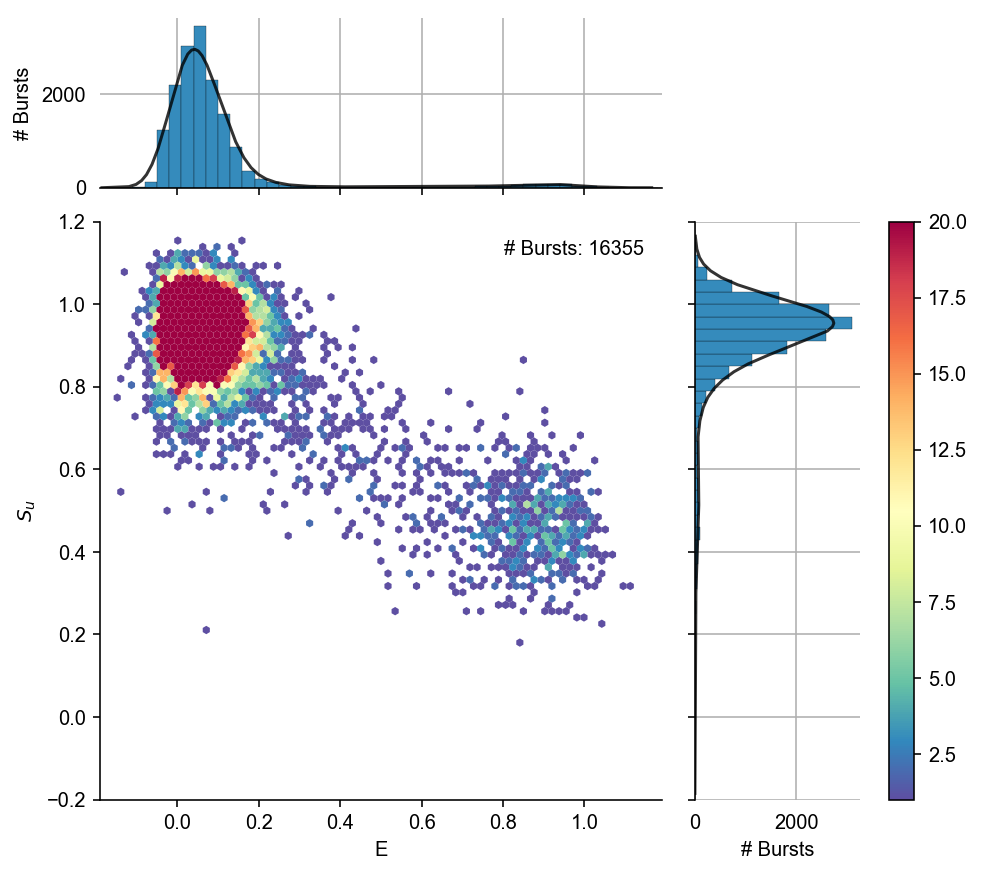

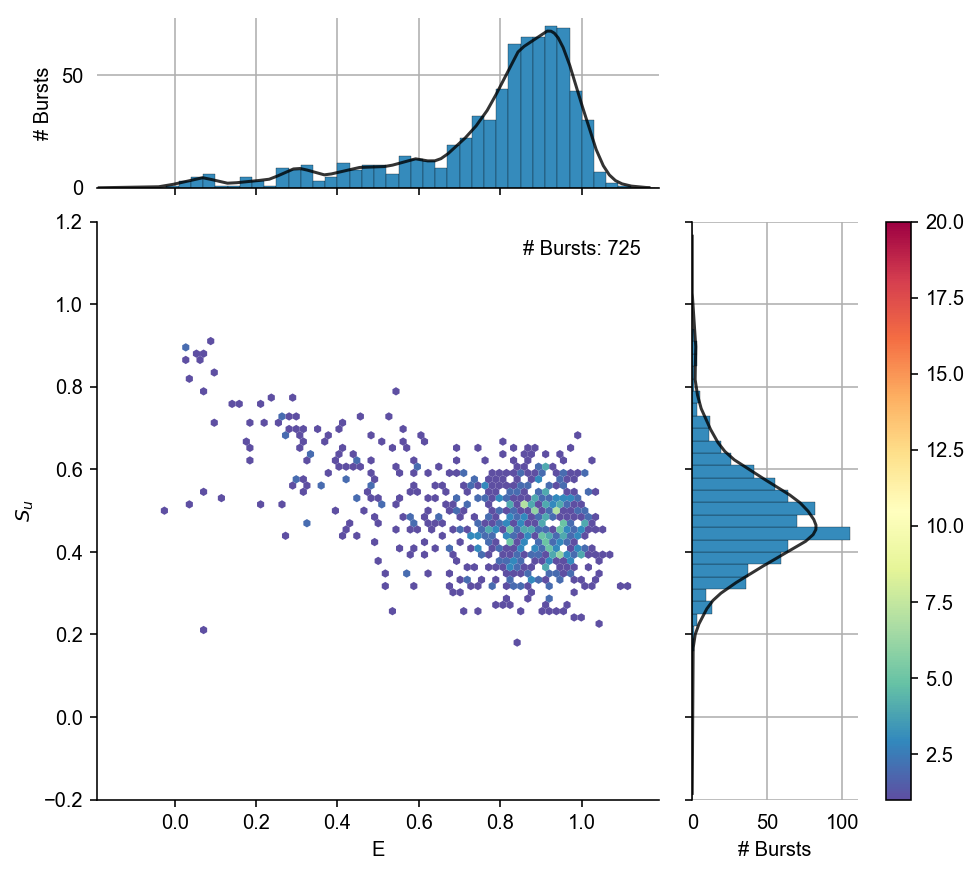

In [187]:
g = alex_jointplot(dcs0, S_name='Su', vmax=20, gridsize=80)
g.ax_joint.set_ylabel('$S_u$')
plt.savefig(f'{fig_name_50kcps}_Dex_th_{size_nf_th}_alex_hist_Su_48spot.png', 
            bbox_to_anchor='tight', dpi = 1200)
g = alex_jointplot(dcss0, S_name='Su', vmax=20, gridsize=80)
g.ax_joint.set_ylabel('$S_u$')
plt.savefig(f'{fig_name_75kcps}_Dex_th_{size_f_th}_alex_hist_Su_48spot.png', 
            bbox_to_anchor='tight', dpi = 1200)

In [192]:
num_bursts_Dex_50kcps = 16355 - 725
num_bursts_Dex_50kcps

15630

In [188]:
dcss2 = dcs2.select_bursts(select_bursts.size, th1=size_Aex, **naa_sel_kws)
Su = [(nd + na)/(nd + na + naa) for nd, na, naa in zip(dcss2.nd, dcss2.na, dcss2.naa)]
dcss2.add(Su=Su)

/Users/maya/anaconda3/envs/py37-fb/lib/python3.7/site-packages/seaborn/axisgrid.py:1847: UserWarning: JointGrid annotation is deprecated and will be removed in a future release.
  warnings.warn(UserWarning(msg))
/Users/maya/anaconda3/envs/py37-fb/lib/python3.7/site-packages/seaborn/axisgrid.py:1847: UserWarning: JointGrid annotation is deprecated and will be removed in a future release.
  warnings.warn(UserWarning(msg))


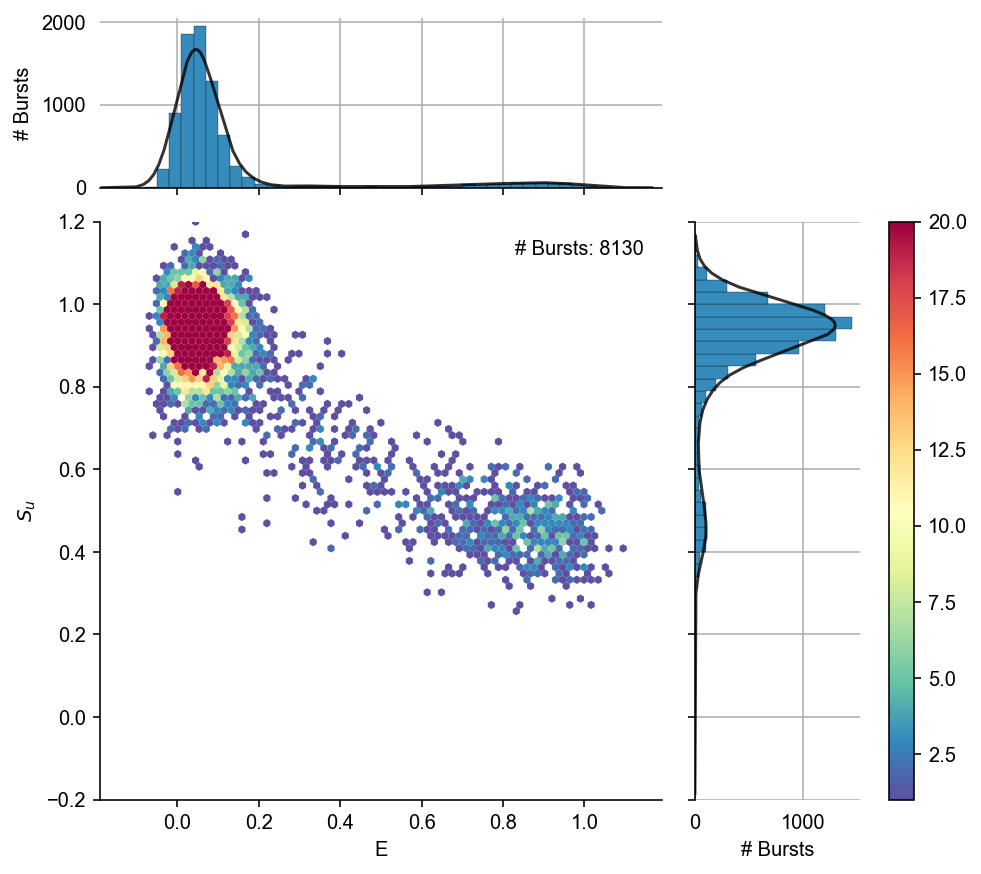

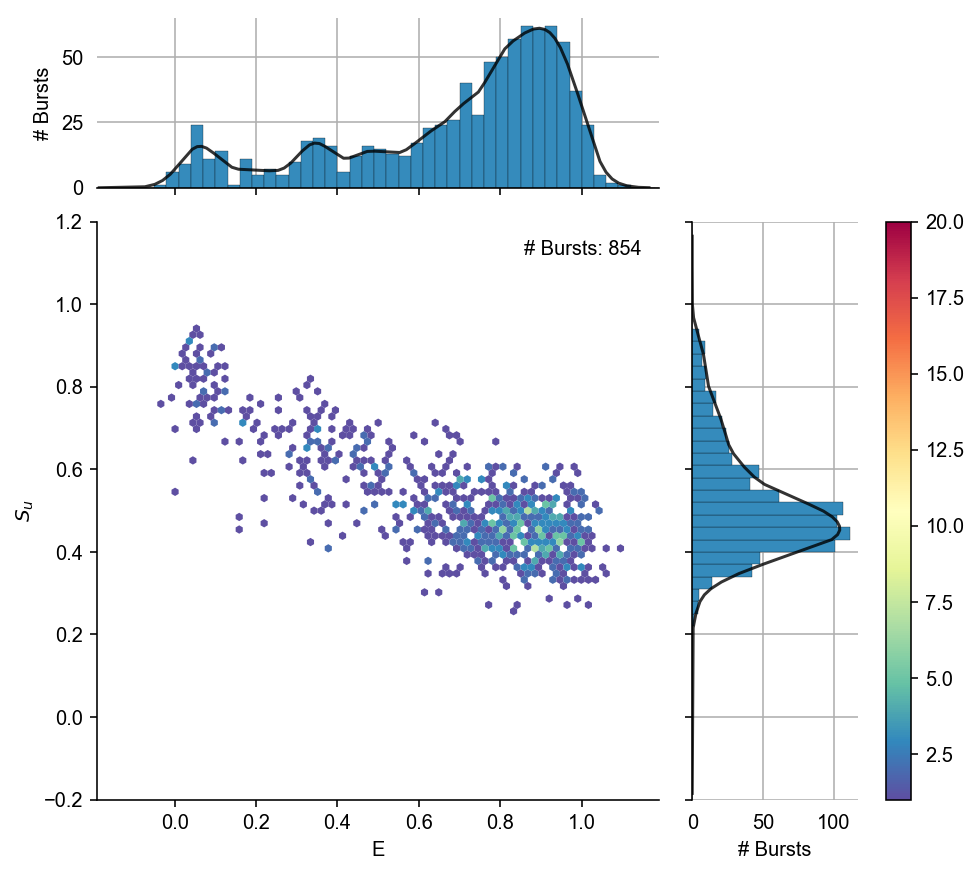

In [189]:
g = alex_jointplot(dcs2, S_name='Su', vmax=20, gridsize=80)
g.ax_joint.set_ylabel('$S_u$')
plt.savefig(f'{fig_name_50kcps}_Dex_th_{size_nf_th}_alex_hist_Su_48spot.png', 
            bbox_to_anchor='tight', dpi = 1200)
g = alex_jointplot(dcss2, S_name='Su', vmax=20, gridsize=80)
g.ax_joint.set_ylabel('$S_u$')
plt.savefig(f'{fig_name_75kcps}_Dex_th_{size_f_th}_alex_hist_Su_48spot.png', 
            bbox_to_anchor='tight', dpi = 1200)

In [191]:
num_bursts_Dex_75kcps = 8130 - 854
num_bursts_Dex_75kcps

7276

# Save burst search results to CSV

Burst search results are loaded into a DataFrame and saved as .CSV

In [121]:
Path('results/').mkdir(exist_ok=True)

## Save size selected burst results for all 48-spots

In [122]:
sel_nf_params = dict(size_sel=size_nf_th)
sel_f_params = dict(size_sel=size_f_th)
sel_nf_params.items(), sel_f_params.items()

(dict_items([('size_sel', 40)]), dict_items([('size_sel', 64)]))

In [123]:
fname_bursts_50kcps = f'results/{f0}_bsearch_params'
for k, v in bsearch_params_constant_50kcps.items():
    fname_bursts_50kcps += f'_{k}_{v}'
for k, v in sel_nf_params.items():
    fname_bursts_50kcps += f'_{k}_{v}'
fname_bursts_50kcps

'results/05_-8TA_-3NTD_500pM_bsearch_params_m_10_ph_sel_all_pax_True_min_rate_cps_50000_size_sel_40'

In [124]:
fname_bursts_75kcps = f'results/{f1}_bsearch_params'
for k, v in bsearch_params_constant_75kcps.items():
    fname_bursts_75kcps += f'_{k}_{v}'
for k, v in sel_f_params.items():
    fname_bursts_75kcps += f'_{k}_{v}'
fname_bursts_75kcps

'results/06_-8TA_-3NTD_500pM_ASchip_bsearch_params_m_10_ph_sel_all_pax_True_min_rate_cps_75000_size_sel_64'

In [125]:
bursts_m10_50kcps = bext.burst_data(ds0, include_bg=False)
bursts_m10_75kcps = bext.burst_data(ds2, include_bg=False)

In [126]:
bursts_m10_50kcps.to_csv(fname_bursts_50kcps + '.csv')
bursts_m10_75kcps.to_csv(fname_bursts_75kcps + '.csv')

In [127]:
sample_description_noflow = 'no_flow_control'
sample_description_flow = 'Streets_chip'

burst_search_50kcps = '50kcps'
burst_search_75kcps = '75kcps'

In [128]:
dfs_50kcps = pd.read_csv(fname_bursts_50kcps + '.csv', index_col=0).assign(sample_description=sample_description_noflow).assign(burst_search=burst_search_50kcps)
dfs_50kcps.head()

,size_raw,t_start,t_stop,width_ms,E,S,nd,na,nt,nda,naa,max_rate,nar,spot,sample_description,burst_search
0,111,102.667839,102.669001,1.161950,0.955234,0.747928,1.243112,41.488526,101.503736,2.645547,56.126551,309880.240111,41.488526,4,no_flow_control,50kcps
1,88,110.407950,110.409052,1.101175,0.939582,0.546233,0.120795,25.723174,77.497363,3.187350,48.466045,316183.282698,25.723174,5,no_flow_control,50kcps
2,60,118.680983,118.681695,0.712013,0.961830,0.312135,1.784918,12.174412,53.209064,-0.818641,40.068374,197970.226997,12.174412,5,no_flow_control,50kcps
3,87,177.639082,177.639964,0.881787,0.867699,0.684843,5.645222,28.043719,79.512355,2.906595,42.916819,208928.810756,28.043719,5,no_flow_control,50kcps
4,79,16.266194,16.267089,0.895138,0.958539,0.586595,0.741368,24.626255,69.489070,1.389020,42.732426,328298.105690,24.626255,6,no_flow_control,50kcps


In [129]:
dfs_75kcps = pd.read_csv(fname_bursts_75kcps + '.csv', index_col=0).assign(sample_description=sample_description_flow).assign(burst_search=burst_search_75kcps)
dfs_75kcps.head()

,size_raw,t_start,t_stop,width_ms,E,S,nd,na,nt,nda,naa,max_rate,nar,spot,sample_description,burst_search
0,88,165.311724,165.312490,0.766362,0.897282,0.707280,1.648774,28.577884,76.880199,4.894230,41.759311,242898.920792,28.577884,0,Streets_chip,75kcps
1,88,52.385133,52.385775,0.642162,0.923508,0.674301,1.220408,28.693649,77.148023,3.532821,43.701144,248693.745765,28.693649,1,Streets_chip,75kcps
2,113,164.239650,164.240711,1.061325,0.878874,0.890373,1.454093,39.860637,96.292627,9.533025,45.444872,322414.567958,39.860637,1,Streets_chip,75kcps
3,94,9.766095,9.766852,0.756850,0.920775,0.533349,-0.520087,25.306626,79.015157,4.874928,49.353690,291070.538760,25.306626,2,Streets_chip,75kcps
4,961,36.585092,36.589996,4.903738,0.345022,0.908939,269.032320,142.042290,864.625676,270.263866,183.287199,795770.966134,142.042290,2,Streets_chip,75kcps


## Concatenate DataFrames

In [152]:
dataframe_list = [dfs_50kcps, dfs_75kcps]

bursts_all = pd.concat(dataframe_list, ignore_index=True)
#bursts_all['max_rate'] *= 1e-3
bursts_all.sample(10).sort_values(['sample_description'])

,size_raw,t_start,t_stop,width_ms,E,S,nd,na,nt,nda,naa,max_rate,nar,spot,sample_description,burst_search
283,133,99.523382,99.524350,0.967650,0.875858,0.538185,4.279633,31.774154,103.685331,4.727542,62.904001,301646.441416,31.774154,30,Streets_chip,75kcps
256,150,182.776876,182.777897,1.021025,0.909670,0.788411,1.722723,47.757764,119.089800,7.761912,61.847401,333901.956994,47.757764,28,Streets_chip,75kcps
122,262,86.903639,86.905220,1.580762,0.470059,0.989956,46.723529,50.940644,217.841252,68.136866,52.040214,403285.891786,50.940644,8,Streets_chip,75kcps
357,88,3.928983,3.929687,0.704700,0.771019,0.355914,2.705785,13.508045,66.744298,5.317563,45.212905,657837.092755,13.508045,41,Streets_chip,75kcps
349,118,12.661668,12.662562,0.893912,0.790253,0.748531,8.871466,34.111197,100.831044,9.235924,48.612457,375714.005031,34.111197,40,Streets_chip,75kcps
391,151,32.628488,32.629559,1.071287,0.775348,0.753293,11.375236,40.809920,122.506638,12.273554,58.047928,396006.764978,40.809920,45,Streets_chip,75kcps
344,154,111.413497,111.414598,1.100912,0.804620,0.640214,9.247537,41.732011,132.878172,11.019378,70.879247,375273.161644,41.732011,38,Streets_chip,75kcps
222,87,146.133112,146.133746,0.634100,0.874637,0.548684,2.246178,22.802556,73.586161,4.290488,44.246939,798349.349000,22.802556,23,Streets_chip,75kcps
193,249,197.892726,197.894470,1.743550,0.788468,0.530090,20.036075,50.044699,183.206735,6.816095,106.309866,374421.444576,50.044699,17,Streets_chip,75kcps
128,92,123.079186,123.079998,0.811950,0.607048,0.389082,6.393211,11.863592,69.771767,8.965756,42.549209,339947.997765,11.863592,8,Streets_chip,75kcps


In [153]:
bursts_all.groupby(['spot', 'sample_description']).head()

,size_raw,t_start,t_stop,width_ms,E,S,nd,na,nt,nda,naa,max_rate,nar,spot,sample_description,burst_search
0,111,102.667839,102.669001,1.161950,0.955234,0.747928,1.243112,41.488526,101.503736,2.645547,56.126551,309880.240111,41.488526,4,no_flow_control,50kcps
1,88,110.407950,110.409052,1.101175,0.939582,0.546233,0.120795,25.723174,77.497363,3.187350,48.466045,316183.282698,25.723174,5,no_flow_control,50kcps
2,60,118.680983,118.681695,0.712013,0.961830,0.312135,1.784918,12.174412,53.209064,-0.818641,40.068374,197970.226997,12.174412,5,no_flow_control,50kcps
3,87,177.639082,177.639964,0.881787,0.867699,0.684843,5.645222,28.043719,79.512355,2.906595,42.916819,208928.810756,28.043719,5,no_flow_control,50kcps
4,79,16.266194,16.267089,0.895138,0.958539,0.586595,0.741368,24.626255,69.489070,1.389020,42.732426,328298.105690,24.626255,6,no_flow_control,50kcps
5,127,12.556413,12.557915,1.502012,0.887274,1.000799,6.667128,46.664486,105.144167,5.190051,46.622502,357922.658125,46.664486,7,no_flow_control,50kcps
6,169,32.775452,32.777623,2.171400,0.958117,0.746405,3.343167,56.655819,138.355489,1.610126,76.746378,177809.022503,56.655819,7,no_flow_control,50kcps
7,91,52.570312,52.571396,1.084563,0.929134,0.707854,3.106023,29.458291,76.495579,1.387631,42.543634,254070.990755,29.458291,7,no_flow_control,50kcps
8,129,165.576027,165.577499,1.472562,0.908324,0.982038,-0.477254,50.292555,111.749790,10.629226,51.305262,202229.349293,50.292555,7,no_flow_control,50kcps
9,104,166.873811,166.875149,1.337462,0.795510,0.500836,6.933511,23.449204,88.332407,5.121967,52.827725,188792.078671,23.449204,7,no_flow_control,50kcps


In [154]:
num_bursts_list = [] 

for i, df in enumerate(dataframe_list):
    num_bursts = len(df)
    num_bursts_list.append(num_bursts)
    print(f'Number of bursts = {num_bursts}, sample ID = {i}')
num_bursts_list

Number of bursts = 62, sample ID = 0
Number of bursts = 343, sample ID = 1


[62, 343]

In [155]:
mask_noflow = bursts_all.sample_description == sample_description_noflow
mask_flow = bursts_all.sample_description == sample_description_flow

In [156]:
column = 'nt'

In [157]:
size0 = bursts_all.loc[mask_noflow, column]
size0.tail()

57    83.811039
58    64.395566
59    91.337153
60    92.040382
61    82.281594
Name: nt, dtype: float64

In [158]:
size2 = bursts_all.loc[mask_flow, column]
size2.tail()

400     67.467216
401     77.547856
402     85.783675
403     83.728098
404    109.474693
Name: nt, dtype: float64

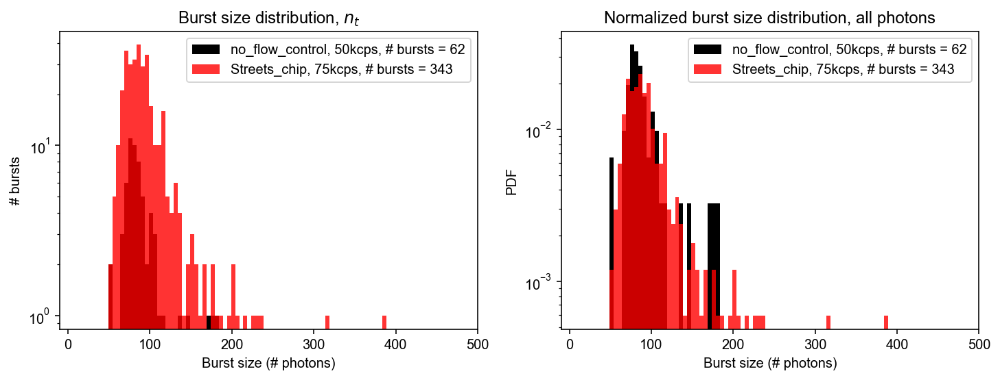

In [159]:
column = 'nt'
binwidth = 5
hist_kws = dict(histtype='stepfilled', lw=2)

fig, ax = plt.subplots(1, 2, figsize=(12, 4), sharex=True)
size0 = bursts_all.loc[mask_noflow, column]
size1 = bursts_all.loc[mask_flow, column]
bins = np.arange(-1, size0.max(), binwidth)
#bin1 = np.arange(-1, size1.max(), binwidth)

ax[0].hist(size0, label=f'{sample_description_noflow}, 50kcps, # bursts = {num_bursts_list[0]}', color='k', bins=bins, **hist_kws)
ax[0].hist(size1, alpha=0.8, label=f'{sample_description_flow}, 75kcps, # bursts = {num_bursts_list[1]}', color='r', bins=bins, **hist_kws)
ax[0].set_yscale('log')
ax[0].legend(loc='upper right')
ax[0].set_ylabel('# bursts')
ax[0].set_xlabel('Burst size (# photons)')
ax[0].set_title('Burst size distribution, $n_t$');
ax[0].set_xlim(-10, 500)

column = 'nt'
size2 = bursts_all.loc[mask_noflow, column]
size3 = bursts_all.loc[mask_flow, column]
bins = np.arange(-1, size2.max(), binwidth)
#bin1 = np.arange(-1, size3.max(), binwidth)

ax[1].hist(size2, density=True, stacked=True, label=f'{sample_description_noflow}, 50kcps, # bursts = {num_bursts_list[0]}',  
           color='k', bins=bins, range=(0,500), **hist_kws)
ax[1].hist(size3, alpha=0.8, density=True, stacked=True, label=f'{sample_description_flow}, 75kcps, # bursts = {num_bursts_list[1]}', 
           color='r', bins=bins, range=(0,500), **hist_kws)
ax[1].set_yscale('log')
ax[1].legend(loc='upper right')
ax[1].set_ylabel('PDF')
ax[1].set_xlabel('Burst size (# photons)')
ax[1].set_title('Normalized burst size distribution, all photons');
ax[1].set_xlim(-10, 500);

plt.savefig(f'{save_dir}/burst_size_distribution_vs_PDF_50kcps_size_sel_{size_nf_th}_75kcps_size_sel_{size_f_th}.png', 
            bbox_to_anchor='tight', dpi=1200)

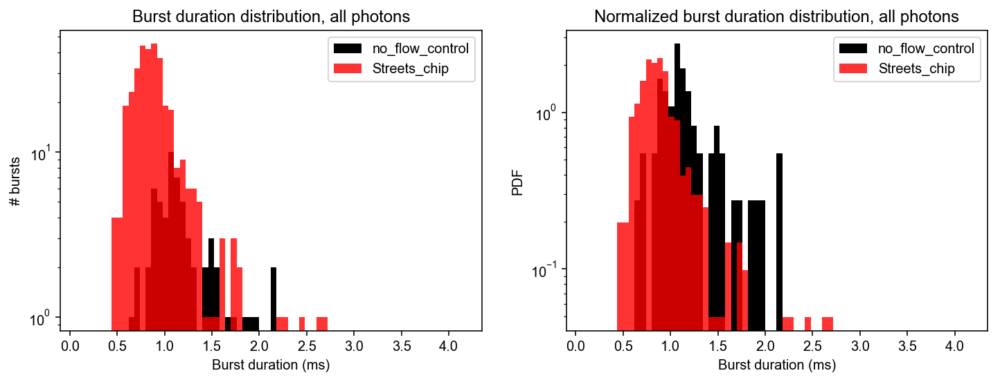

In [160]:
column = 'width_ms'
binwidth = 0.06
hist_kws = dict(histtype='stepfilled', lw=2)

fig, ax = plt.subplots(1, 2, figsize=(12, 4), sharex=True)
width0 = bursts_all.loc[mask_noflow, column]
width1 = bursts_all.loc[mask_flow, column]
bins = np.arange(-1, width0.max(), binwidth)
#bin1 = np.arange(-1, width1.max(), binwidth)

ax[0].hist(width0, label=f'{sample_description_noflow}', color='k', bins=bins, **hist_kws)
ax[0].hist(width1, alpha=0.8, label=f'{sample_description_flow}', color='r', bins=bins, **hist_kws)
ax[0].set_yscale('log')
ax[0].legend(loc='upper right')
ax[0].set_ylabel('# bursts')
ax[0].set_xlabel('Burst duration (ms)')
ax[0].set_title('Burst duration distribution, all photons')
ax[0].set_xlim(-.1, width0.quantile(0.99999) + 1)

width2 = bursts_all.loc[mask_noflow, column]
width3 = bursts_all.loc[mask_flow, column]
bins = np.arange(-1, width2.max(), binwidth)

ax[1].hist(width2, density=True, stacked=True, label=f'{sample_description_noflow}', 
           color='k', bins=bins, range=(0,500), **hist_kws)
ax[1].hist(width3, alpha=0.8, density=True, stacked=True, label=f'{sample_description_flow}', 
           color='r', bins=bins, range=(0,500), **hist_kws)
ax[1].set_yscale('log')
ax[1].legend(loc='upper right')
ax[1].set_ylabel('PDF')
ax[1].set_xlabel('Burst duration (ms)')
ax[1].set_title('Normalized burst duration distribution, all photons')
ax[1].set_xlim(-.1, width0.quantile(0.99999) + 1)

plt.savefig(f'{save_dir}/burst_width_distribution_vs_PDF_size_sel_{size_nf_th}.png', 
            bbox_to_anchor='tight', dpi=1200);

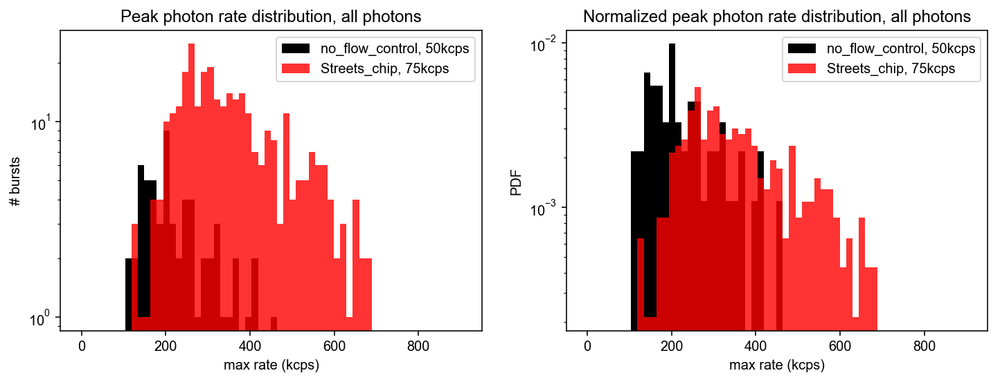

In [161]:
column = 'max_rate'
binwidth = 15
hist_kws = dict(histtype='stepfilled', lw=2)

fig, ax = plt.subplots(1, 2, figsize=(12, 4), sharex=True)
width0 = bursts_all.loc[mask_noflow, column]*1e-3
width1 = bursts_all.loc[mask_flow, column]*1e-3
bins = np.arange(-1, width0.max(), binwidth)
#bin1 = np.arange(-1, width1.max(), binwidth)

ax[0].hist(width0, label=f'{sample_description_noflow}, 50kcps', color='k', bins=bins, **hist_kws)
ax[0].hist(width1, alpha=0.8, label=f'{sample_description_flow}, 75kcps', color='r', bins=bins, **hist_kws)
ax[0].set_yscale('log')
ax[0].legend(loc='upper right')
ax[0].set_ylabel('# bursts')
ax[0].set_xlabel('max rate (kcps)')
ax[0].set_title('Peak photon rate distribution, all photons');
ax[0].set_xlim(-50, width0.quantile(0.99999) + 250)

width2 = bursts_all.loc[mask_noflow, column]*1e-3
width3 = bursts_all.loc[mask_flow, column]*1e-3
bins = np.arange(-1, width2.max(), binwidth)
#bin1 = np.arange(-1, width3.max(), binwidth)

ax[1].hist(width2, density=True, stacked=True, label=f'{sample_description_noflow}, 50kcps', 
           color='k', bins=bins, range=(0,500), **hist_kws)
ax[1].hist(width3, density=True, stacked=True, label=f'{sample_description_flow}, 75kcps', 
           alpha=0.8, color='r', bins=bins, range=(0,500), **hist_kws)
ax[1].set_yscale('log')
ax[1].legend(loc='upper right')
ax[1].set_ylabel('PDF')
ax[1].set_xlabel('max rate (kcps)')
ax[1].set_title('Normalized peak photon rate distribution, all photons');
ax[1].set_xlim(-50, width0.quantile(0.99999) + 250);

plt.savefig(f'{save_dir}/peak_photon_rate_distribution_vs_PDF_50kcps_size_sel_{size_nf_th}_75kcps_size_sel_{size_f_th}.png', 
            bbox_to_anchor='tight', dpi=1200)